<a href="https://colab.research.google.com/github/PPierzc/PracowniaEEG/blob/master/Cw2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as st
import copy
import tqdm
import itertools


# Analiza Modeli

### Signal Constructor Functions


---


In [0]:
params = {
'T': 1,
'Fs': 128,
't0' : 0.3,
'sigma' : .02,
}

#### Sin

In [0]:
def sin(f = 1, T = 1, Fs = 128, phi =0, **kwargs):
 
	dt = 1.0/Fs
	x = np.arange(0,T,dt)
	g = np.sin(2*np.pi*f*x + phi)
	return x, g

#### G_1

In [0]:
def  g_1(t0=0, sigma=1, Fs=128, T=1):
#   x = np.arange(0, T, 1/Fs)
#   g = st.norm.pdf(x, loc=t0, scale=sigma)
#   return x, g

  x = np.arange(0, T, 1/Fs)
  g = np.empty(len(x))
  for i,dt in enumerate(x):
    
    g[i] = np.exp(-.5 * (dt - t0)* (dt - t0) / (sigma*sigma) )
    
  return x, g

#### G_2

In [0]:
def g_2(t0=0, sigma=1, Fs=128, T=1):
  
  '''acording to : https://www.wolframalpha.com/input/?i=d%2Fdt+e%5E(-(t-t0)%5E2%2F(2*s%5E2))'''
  x = np.arange(0, T, 1/Fs)
  g = np.empty(len(x))
  
  for i,dt in enumerate(x):
    g[i] = - (dt - t0) * np.exp(-.5 * (dt - t0)* (dt - t0) \
                                / (sigma*sigma) )/(sigma*sigma)
    
    
  return x, g

#### G_3

In [0]:
def g_3(t0=5, sigma=1, Fs=128, T=1):
  x, g = g_1(t0, sigma, Fs, T)
  g[np.where(x < t0)] = 0
  return x, g

#### Noise

In [0]:
def noise(T, Fs, **kwargs):
  x = np.arange(0, T, 1/Fs)
  g = np.random.randn(len(x))
  return x, g

#### Impulse

In [0]:
def impulse(length, x0 = None):
  impulse = np.zeros(length)
  
  if not x0:
    impulse[length // 2] = 1
  else:
    impulse[x0] = 1
    
  return impulse

#### Display Construction Functions

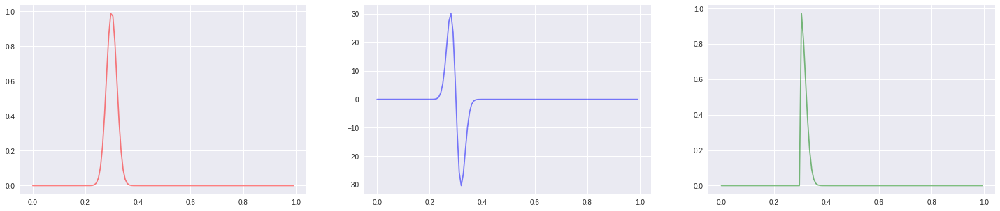

In [22]:
plt.figure(figsize=(25,5))
t,s = g_1(**params)
plt.subplot(1, 3, 1)
plt.plot(t,s, alpha=.5, c='r', label='g_1')

t,s = g_2(**params)
plt.subplot(1, 3, 2)
plt.plot(t,s, alpha=.5, c='b', label='g_2')

t,s = g_3(**params)
plt.subplot(1, 3, 3)
plt.plot(t,s, alpha=.5, c='g', label='g_3')

plt.show()


## Symulacje
---



### Sygnał + Szum

In [0]:
def symulacja(g, N, params):
  x, g = g(**params)
  sims = np.empty((N, len(x)))
  for i in range(N):
    x, g_noise = noise(**params)
    sims[i] = g + g_noise
  return np.var(np.mean(sims, axis=0)), np.var(sims, axis=0)
    

In [0]:
Ns = range(10, 5000, 10)
sims = np.empty((len(Ns)))
for i, N in enumerate(Ns):
  _s, _v = symulacja(g_1, N, params)
  sims[i] = _s

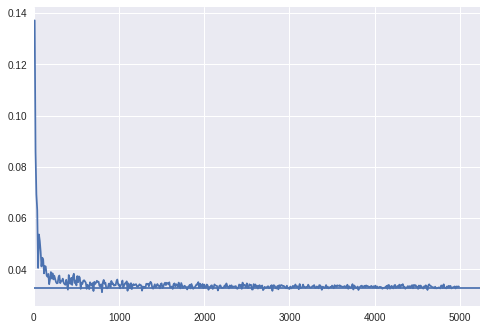

In [35]:
plt.plot(Ns, sims)
plt.axhline(np.var(g_1(**params)[1]))
# plt.axhline(0.0329358, c='r')
plt.xlim((0, None))
plt.show()

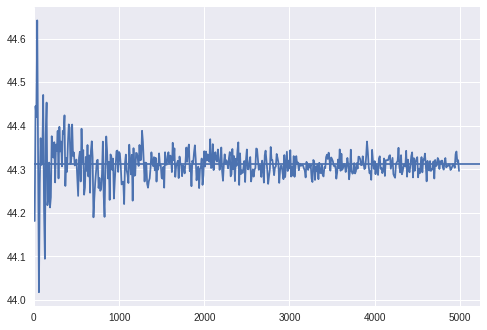

In [37]:
Ns = range(10, 5000, 10)
sims = np.empty((len(Ns)))
for i, N in enumerate(Ns):
  _s, _v = symulacja(g_2, N, params)
  sims[i] = _s
  
plt.plot(Ns, sims)
plt.axhline(np.var(g_2(**params)[1]))
plt.xlim((0, None))
plt.show()

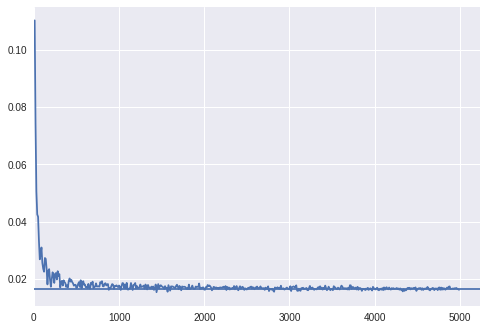

In [38]:
Ns = range(10, 5000, 10)
sims = np.empty((len(Ns)))
for i, N in enumerate(Ns):
  _s, _v = symulacja(g_3, N, params)
  sims[i] = _s
  
plt.plot(Ns, sims)
plt.axhline(np.var(g_3(**params)[1]))
plt.xlim((0, None))
plt.show()

### Sygnał + szum + niezależna czynność rytmiczna

wnioski(in nizsze czestosci tym one sie mniej wysrednia, malo powtorzen - duze skoki, wykresy spadaja jak 1/n wiec git)

In [0]:
def symulacja_sinus(g, N, f, params):
  x, g = g(**params)
  sims = np.empty((N, len(x)))
  for i in range(N):
    x, g_noise = noise(**params)
    x, g_sin = sin(
        phi=np.random.randint(-np.pi, np.pi),
        f=f,
        **params)
    sims[i] = g + g_noise + g_sin
  return np.var(np.mean(sims, axis=0)), np.var(sims, axis=0)

#### Dla G_1

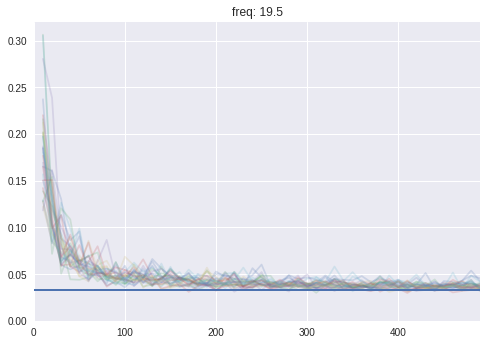

In [31]:
Ns = range(10, 500, 10)
for f in np.arange(5, 20, 0.5):
  sims = np.empty((len(Ns)))
  for i, N in enumerate(Ns):
    _s, _v = symulacja_sinus(g_1, N, f, params)
    sims[i] = _s
  
  plt.plot(Ns, sims, alpha=.2)
  plt.axhline(np.var(g_1(**params)[1]))
plt.xlim((0, max(Ns)))
plt.ylim(0, None)
plt.title(f'freq: {f}')
plt.show()

#### Dla G_2

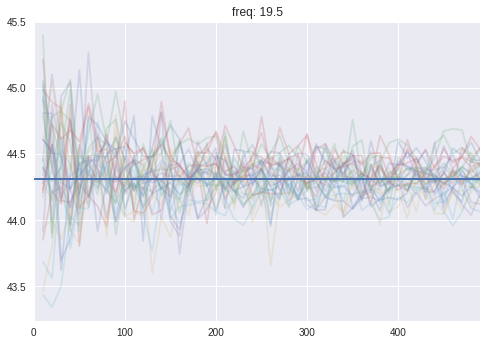

In [33]:
Ns = range(10, 500, 10)
for f in np.arange(5, 20, 0.5):
  sims = np.empty((len(Ns)))
  for i, N in enumerate(Ns):
    _s, _v = symulacja_sinus(g_2, N, f, params)
    sims[i] = _s
  
  plt.plot(Ns, sims, alpha=.2)
  plt.axhline(np.var(g_2(**params)[1]))
plt.xlim((0, max(Ns)))
plt.title(f'freq: {f}')
plt.show()

#### Dla G_3

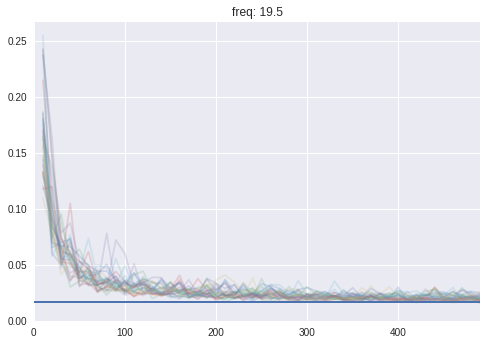

In [34]:
Ns = range(10, 500, 10)
for f in np.arange(5, 20, 0.5):
  sims = np.empty((len(Ns)))
  for i, N in enumerate(Ns):
    _s, _v = symulacja_sinus(g_3, N, f, params)
    sims[i] = _s
  
  plt.plot(Ns, sims, alpha=.2)
  plt.axhline(np.var(g_3(**params)[1]))
plt.xlim((0, max(Ns)))
plt.ylim(0, None)
plt.title(f'freq: {f}')
plt.show()

### Uśrednianie w modelu z resetem fazy (wnioski:)



In [0]:
def sin_reset_phase(f):
  x = np.arange(0, 1, 1/128)
  s = np.empty(len(x))

  half = len(x)//2

  s[:half] = np.sin(2 * np.pi * f * x[:half] + np.random.normal(-np.pi, np.pi))
  s[half:] = np.sin(2 * np.pi * f * x[half:])
  
  return x, s

In [0]:
def get_mean_sin(N, scale):
  sins = np.empty((N, 128))
  x = np.arange(0, 1, 1/128)

  for i, f in enumerate(st.norm.rvs(loc=10, scale=scale, size=N)):
    sins[i] = sin_reset_phase(f)[1]
    
  return x, np.mean(sins, axis=0)

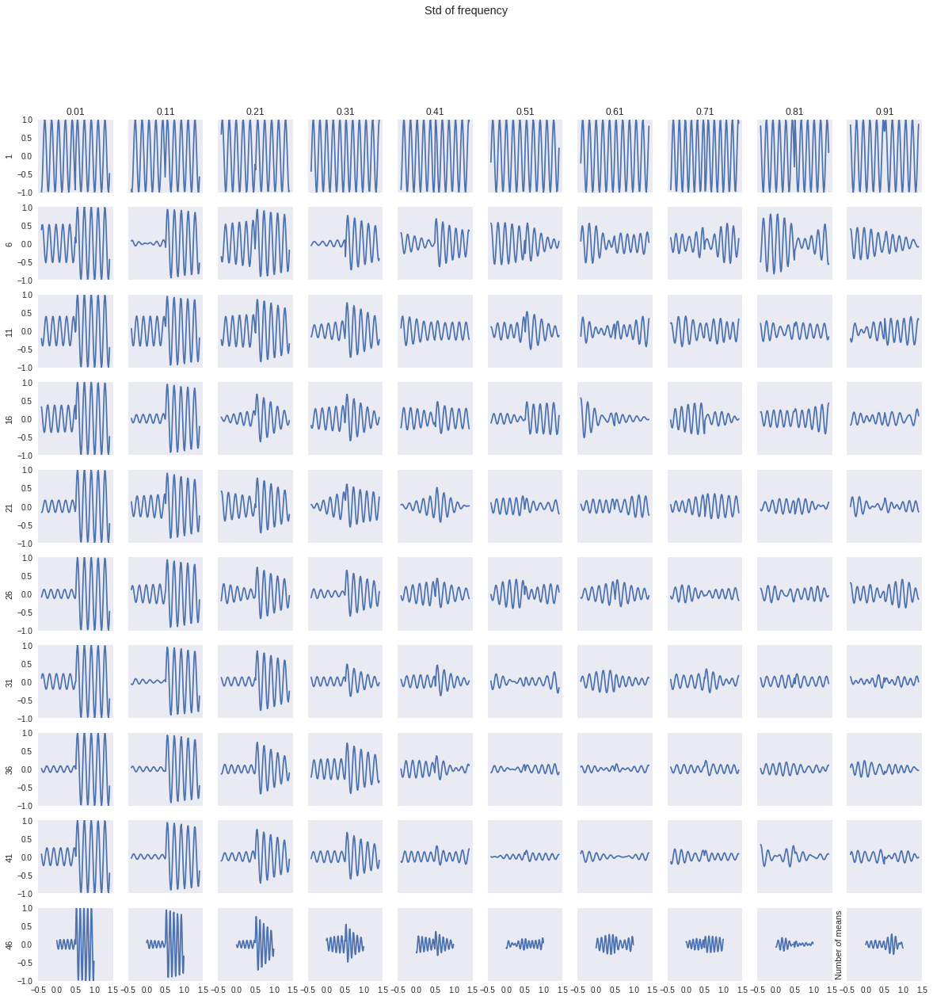

In [40]:
plt.figure(figsize=(20,20))
plt.tight_layout()
N = np.arange(1, 51, 5)
scale = np.arange(0.01, 1, 0.1)

for i, n in enumerate(N):
  for j, s in enumerate(scale):
    pos = (j+1) + (i*len(N))
    plt.subplot(len(scale), len(N), pos)
    plt.plot(*get_mean_sin(n, s))
    plt.ylim(-1, 1)

    xticks = []
    yticks = []

    if not i:
      plt.title(f'{s:.2f}')

    if i == len(N) - 1:
      xticks = plt.xticks()[0]

    if not j:
      plt.ylabel(n)
      yticks = plt.yticks()[0]

    plt.yticks(yticks)
    plt.xticks(xticks)
    plt.grid(False)
    
plt.ylabel('Number of means')
plt.suptitle('Std of frequency')
plt.show()

###Uśrednianie potencjału z fluktuacją latencji

In [0]:
def latency_fluct(g_x, ylim=(0, 1)):
  mean_t0 = .5
  scale = np.arange(0.02, 0.22, 0.02)
  N = np.arange(2, 402, 40)
  params_copy = copy.copy(params)

  plt.figure(figsize=(20,20))
  plt.tight_layout()

  for i, n in enumerate(N):
    for j, s in enumerate(scale):
      pos = (j+1) + (i*len(N))

      sims = []
      for _ in range(n):
        t0 = st.norm.rvs(loc=mean_t0, scale=s)
        params_copy['t0'] = t0
        t, _s = g_x(**params_copy)
        sims.append(_s)

      sim = np.mean(sims, axis=0)

      plt.subplot(len(scale), len(N), pos)
      plt.plot(t, sim)

      xticks = []
      yticks = []

      if not i:
        plt.title(f'{s:.2f}')

      if i == len(N) - 1:
        xticks = plt.xticks()[0]

      if not j:
        plt.ylabel(n)
        yticks = np.arange(-1, 1.5, 0.5)

      plt.yticks(yticks)
      plt.xticks(xticks)
      plt.grid(False)
      plt.ylim(ylim)
      plt.xlim(0, 1)

  plt.ylabel('Number of means')
  plt.suptitle('Std of t0')
  plt.show()

### Latency

#### G_1

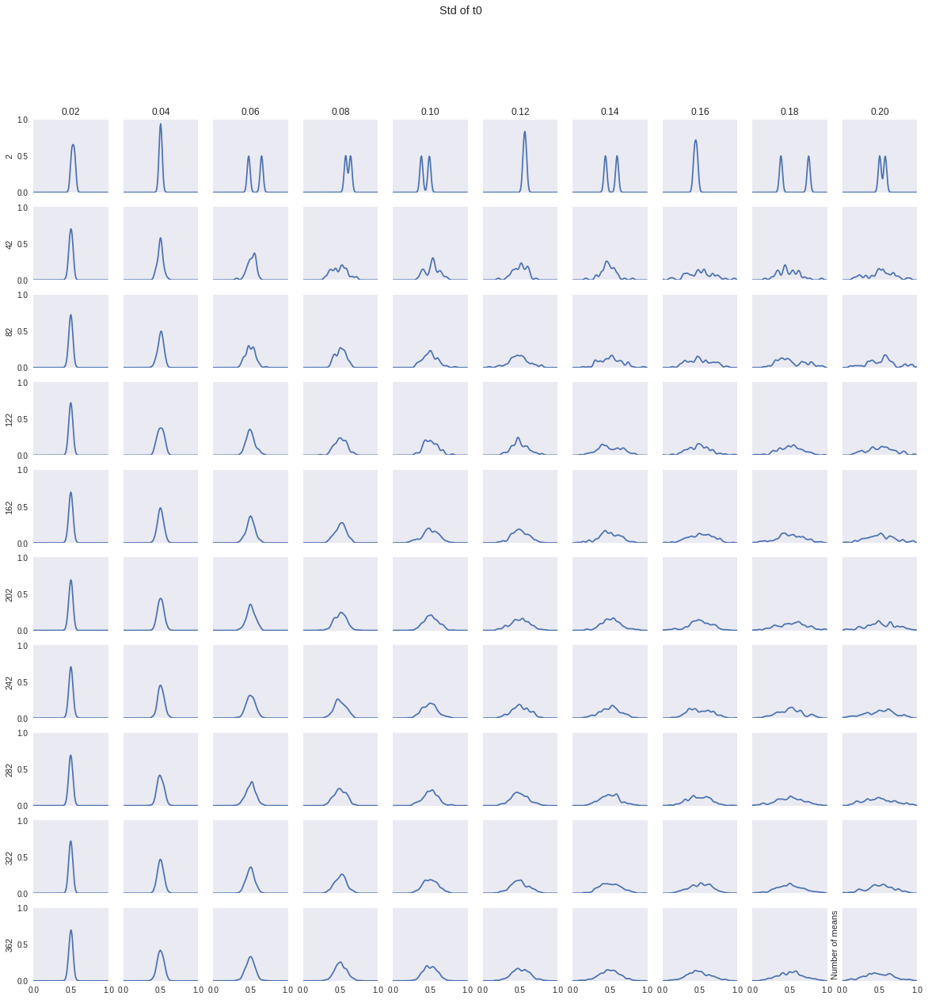

In [102]:
latency_fluct(g_1, (0, 1))

#### G_2




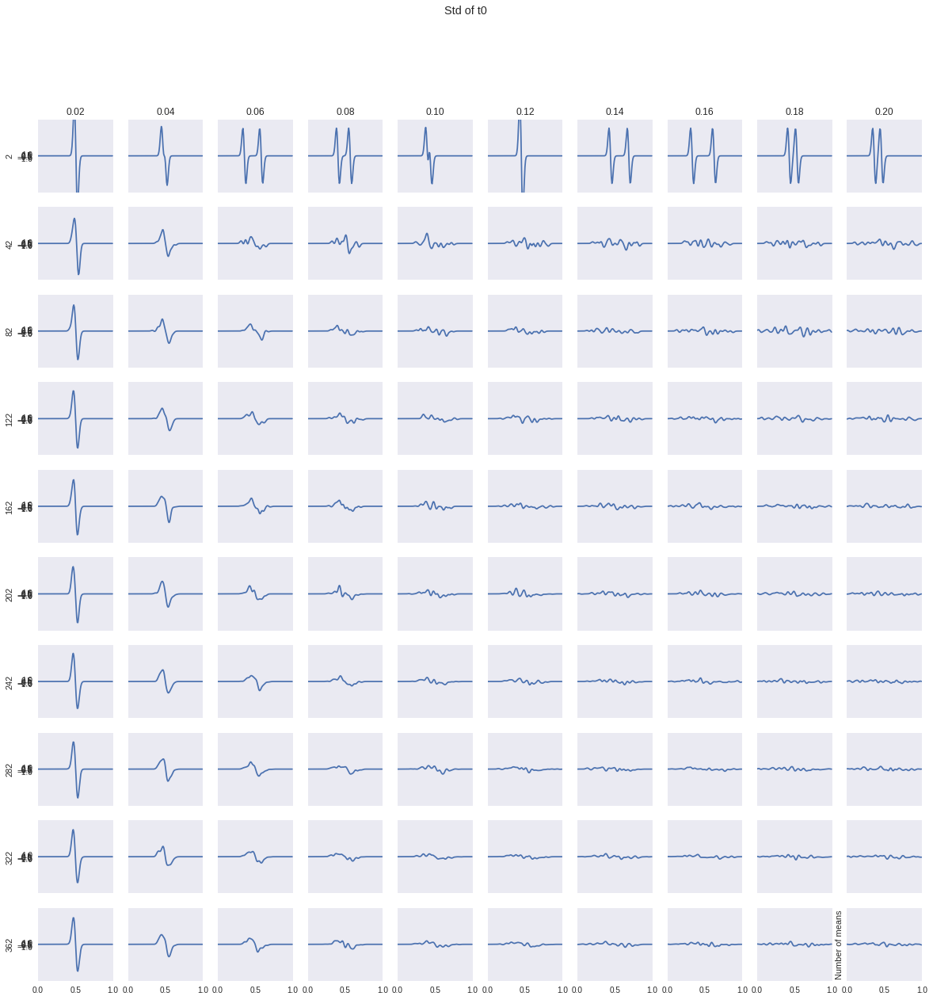

In [103]:
latency_fluct(g_2, (-20, 20))

#### G_3

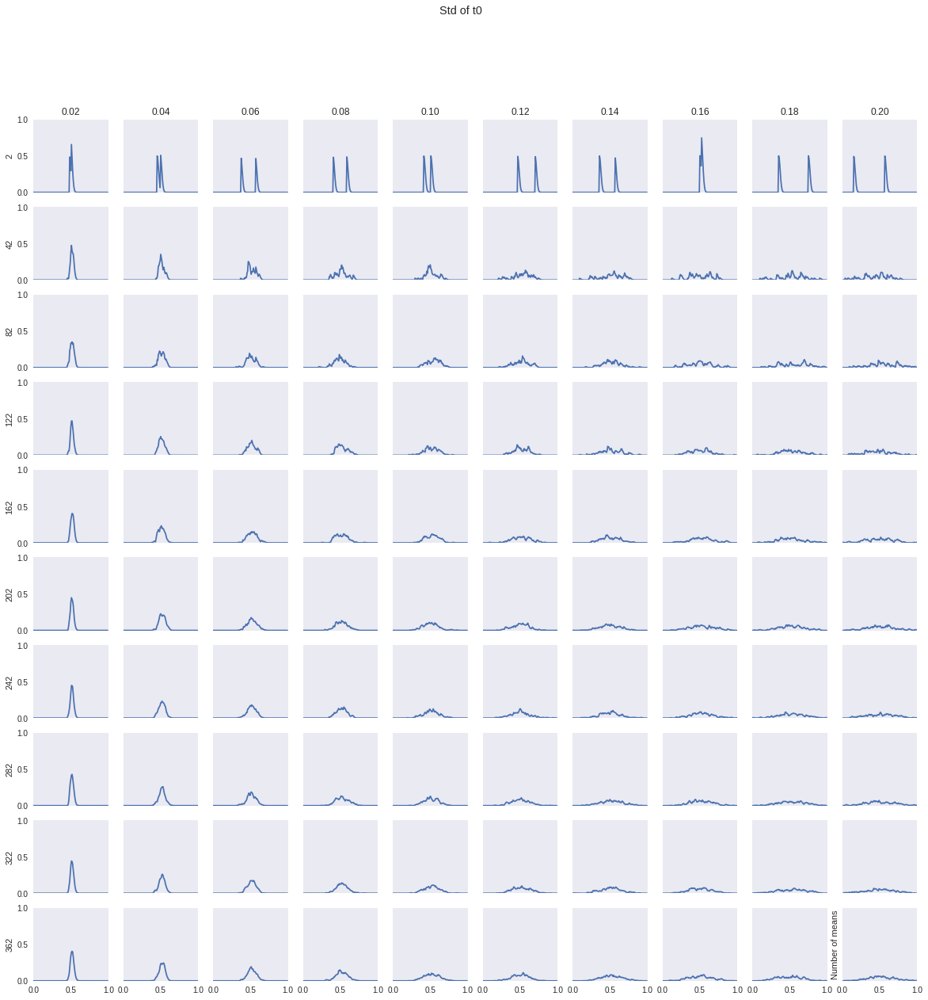

In [104]:
latency_fluct(g_3, (0, 1))

## Filtry

---


#### Filter Definitions

In [0]:
from scipy.signal import butter, filtfilt, iirnotch, freqz, lfilter, cheby2


def _butter_lowpass(cutoff, fs, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    return b, a


def butter_lowpass_filter(data, cutoff, fs, order=5):
    b, a = _butter_lowpass(cutoff, fs, order=order)
    y = filtfilt(b, a, data)
    return y


def _butter_highpass(cutoff, fs, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='high', analog=False)
    return b, a


def butter_highpass_filter(data, cutoff, fs, order=5):
    b, a = _butter_highpass(cutoff, fs, order=order)
    y = filtfilt(b, a, data)
    return y


def notch_filter(data, f0, fs, Q=30):
    nyq = 0.5 * fs
    w0 = f0/nyq
    b, a = iirnotch(w0, Q)
    y = filtfilt(b, a, data)
    return y
  
  
def _cheb2_notch(cutoff, fs, order=5, rs=3, width=.1):
    nq = fs/2
    Wn_min, Wn_max = (cutoff - width) / nq, (cutoff + width) / nq
    Wn = [Wn_min, Wn_max]
    b, a = cheby2(N=order, rs=rs, Wn=Wn, btype='bandstop', analog=False, output='ba')
    return b, a

In [0]:
def filter_test(a, b, f=None, T=1, Fs=128):
    if not f:
      f = np.arange(0.01, Fs/2, 0.01)
    
    t = np.arange(-T, T, 1/Fs)

    w = 2*np.pi* f/Fs

    w, h = freqz(b, a, w)
    
    m = np.abs(h)

    x = impulse(len(t))
    y = lfilter(b,a,x)

    plt.subplot(1,2,1)
    plt.title('moduł transmitancji')
    plt.plot(f, 20*np.log10(m))
    plt.ylabel('[dB]')
    plt.xlabel('f [Hz]')
    plt.grid('on')
  
    plt.subplot(1,2,2)
    plt.title('odpowiedź impulsowa')
    plt.plot(t, x)
    plt.plot(t, y)
    plt.xlim([-T,T])
    plt.xlabel('t [s]')
    plt.grid('on')

### Test Filters

In [0]:
def plot_charaktrystkyki(filter_function, cutoffs, orders):
  for cutoff, order in itertools.product(cutoffs, orders):
      b, a = filter_function(cutoff, Fs, order)

      fig = plt.figure(figsize=(20, 3))
      fig.subplots_adjust(hspace=.5)

      filter_test(a, b)
      
      filter_name = filter_function.__name__[1:].replace("_", " ").title()
      plt.suptitle(f'filter: {filter_name}, order: {order}, cuttoff: {cutoff}Hz')
      plt.show()
  

#### Low Pass

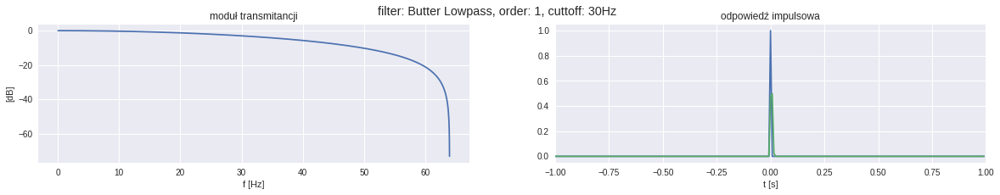

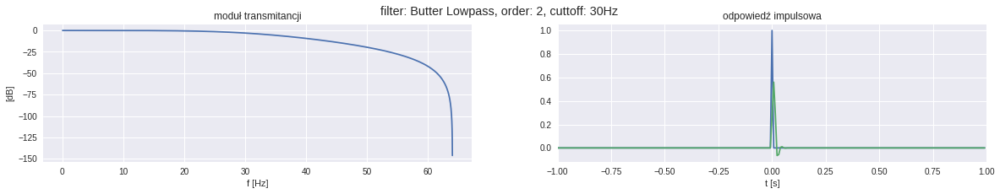

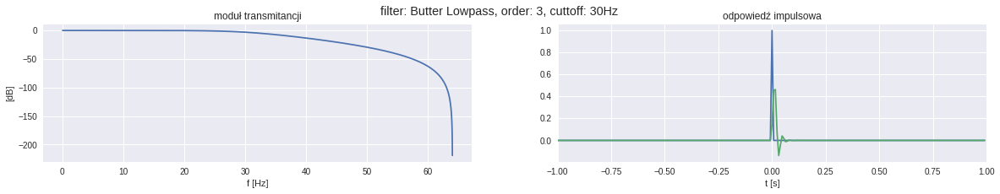

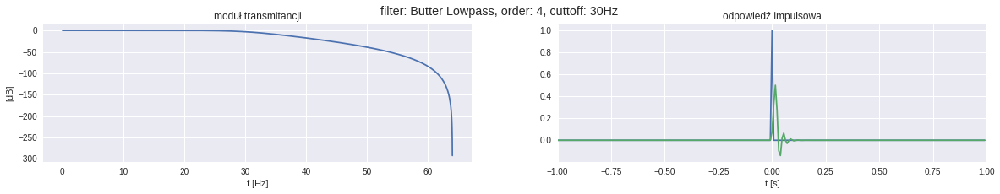

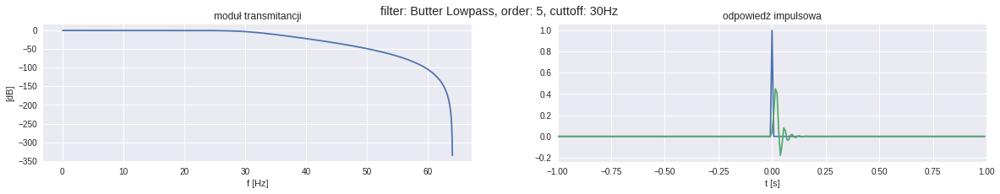

...

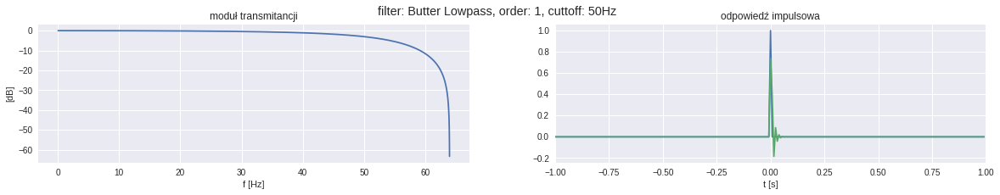

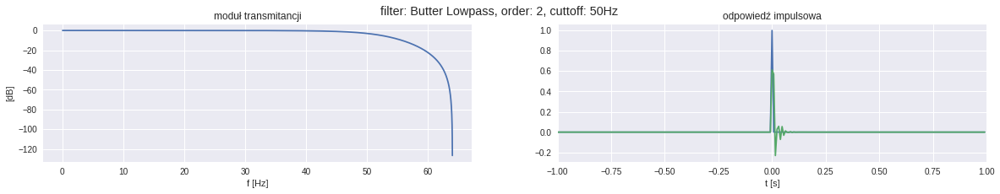

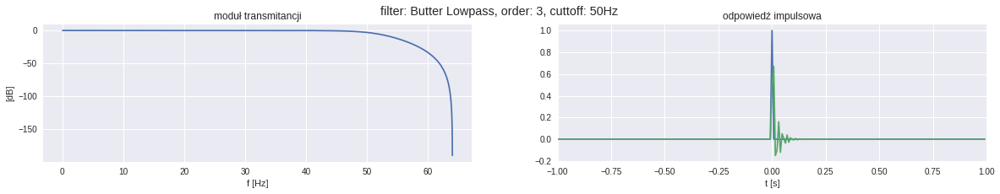

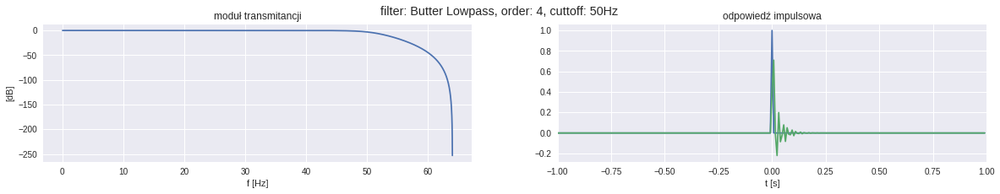

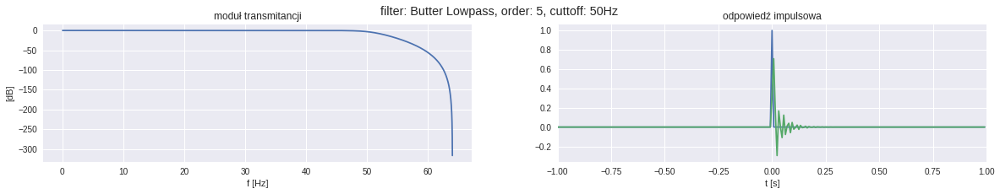

In [24]:
Fs = 128

orders = range(1,6)
cutoffs = [30, 40, 50]
plot_charaktrystkyki(_butter_lowpass, cutoffs, orders)




#### High Pass

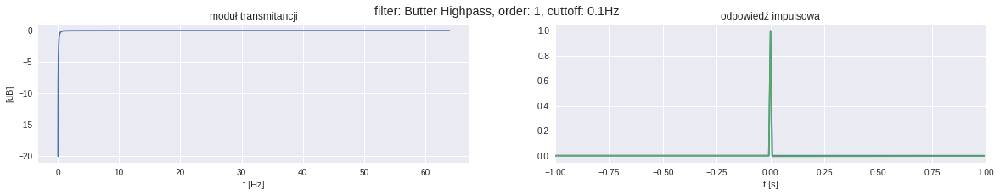

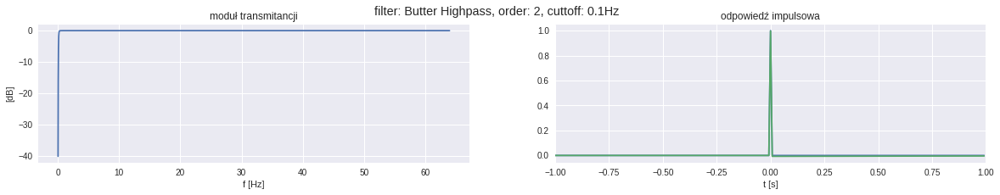

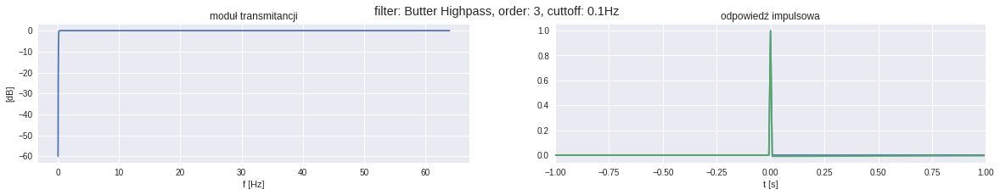

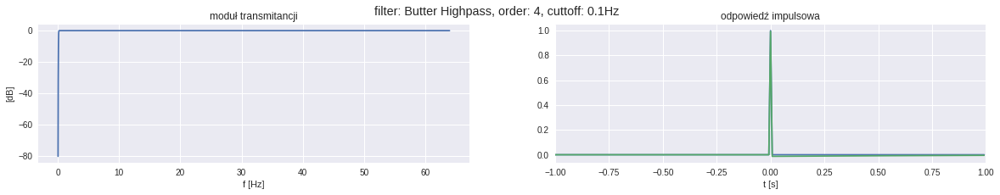

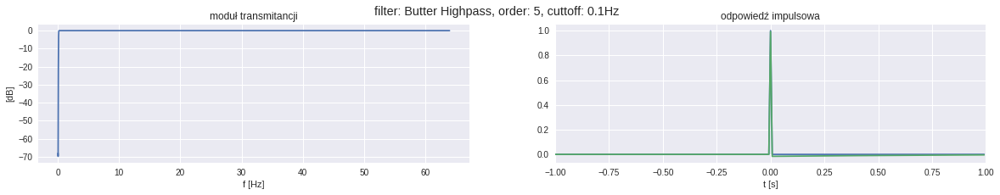

...

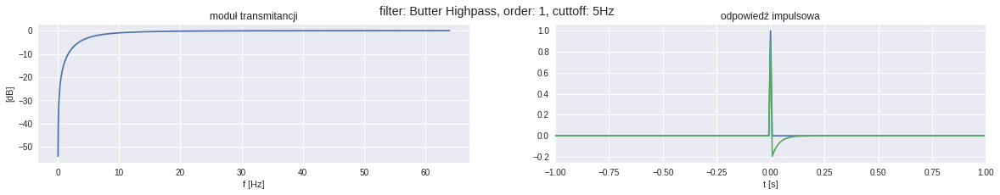

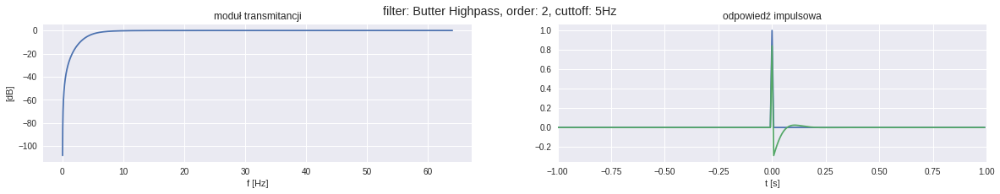

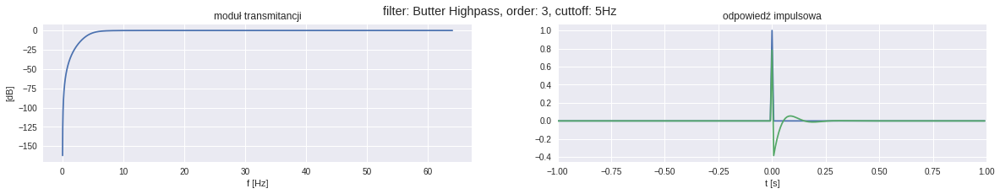

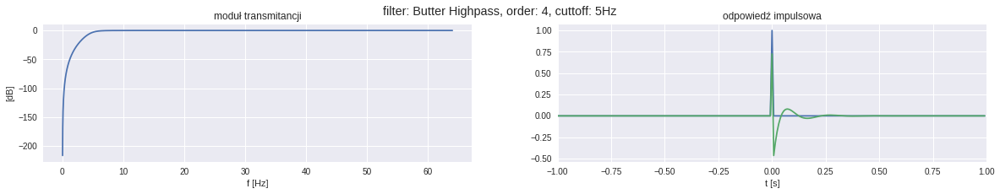

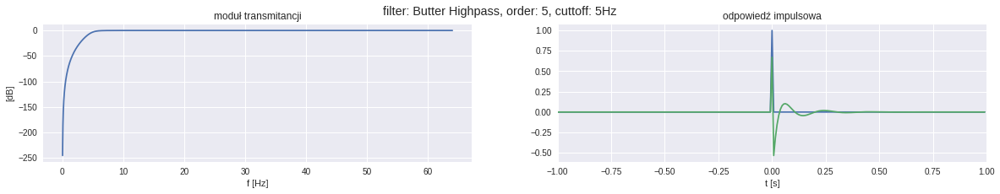

In [37]:
Fs = 128
orders = range(1,6)
cutoffs = [0.1, 0.5, 2, 5 ]
plot_charaktrystkyki(_butter_highpass, cutoffs, orders)

  


#### Notch (Cheby2)

cheby2
[0.7796875, 0.7828125]


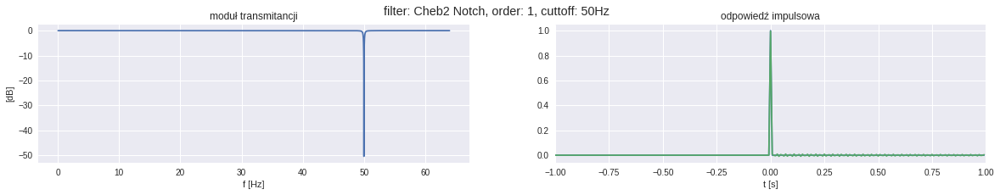

cheby2
[0.7796875, 0.7828125]


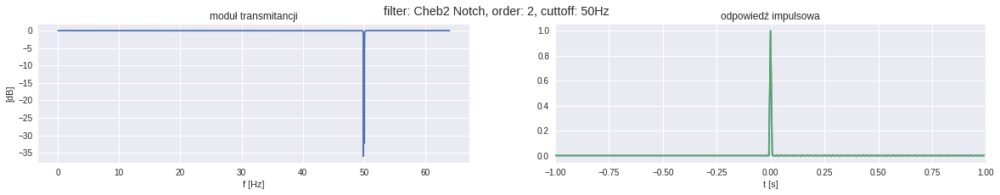

cheby2
[0.7796875, 0.7828125]


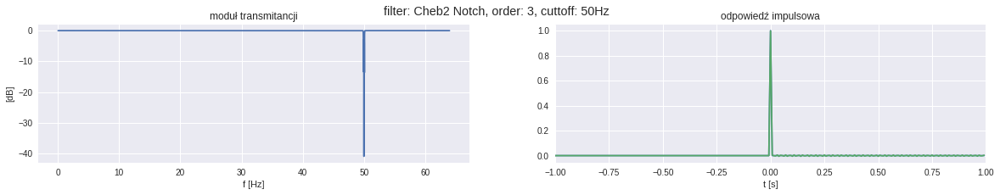

In [11]:
Fs = 128

cutoffs = [50]
orders = range(1,4)

plot_charaktrystkyki(_cheb2_notch, cutoffs, orders)

### Check response on signals

In [0]:
def plot_response(s, t, filter_function, Fs, cutoffs, orders):
  for cutoff, order in itertools.product(cutoffs, orders):

      b, a = filter_function(cutoff, Fs, order)
    
      fig = plt.figure(figsize=(20, 3))
      fig.subplots_adjust(hspace=.5)
      
      for i, _s in enumerate(s):
        fig.add_subplot(1, len(s), i+1)

        y1 = filtfilt(b, a, _s)
        y2 = lfilter(b, a, _s)

        plt.plot(t, _s, label='primary', alpha=0.5, c='k', lw=3)
        plt.plot(t, y1, label='filtfilt', alpha=0.5, c='r')
        plt.plot(t, y2, label='lfilter', alpha=0.5, c='g')

        plt.legend()
        plt.title('G_{}'.format(i+1))
        
      filter_name = filter_function.__name__[1:].replace("_", " ").title()
      plt.suptitle(f'filter: {filter_name}, order: {order}, cuttoff: {cutoff}Hz')
  plt.show()

#### Low Pass

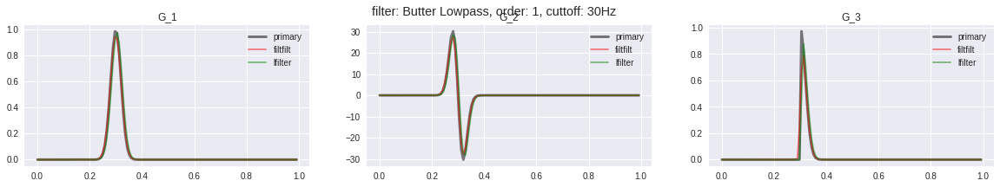

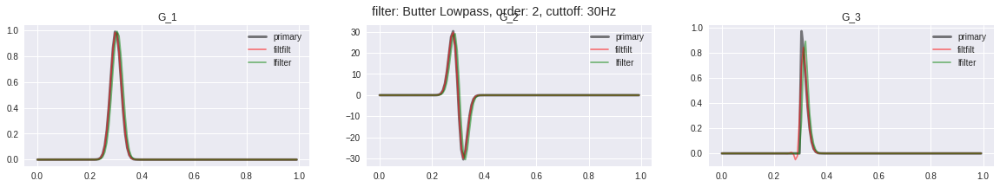

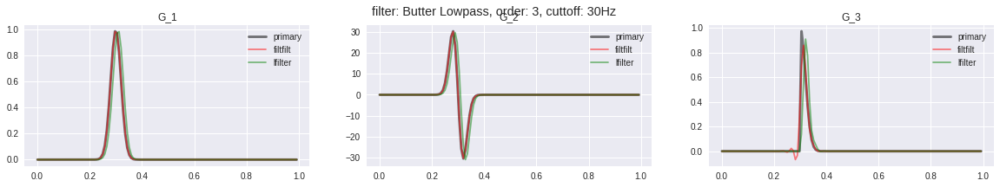

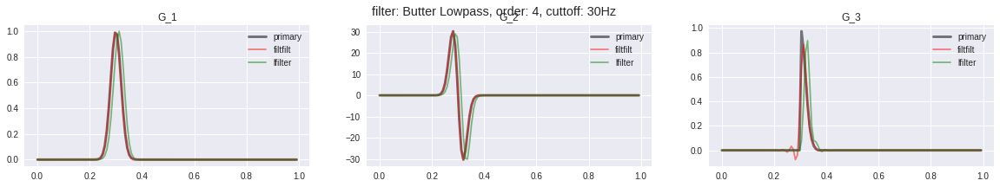

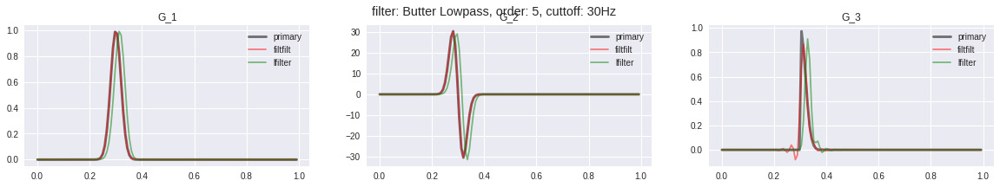

...

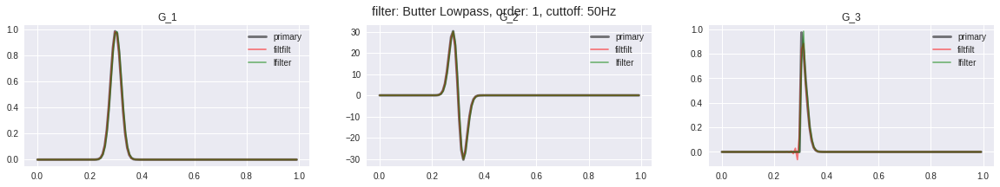

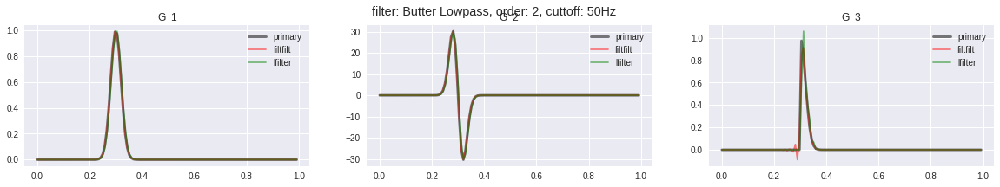

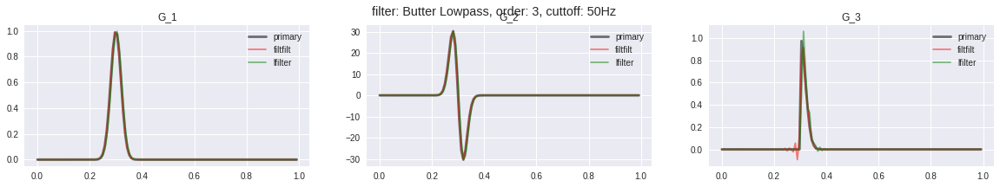

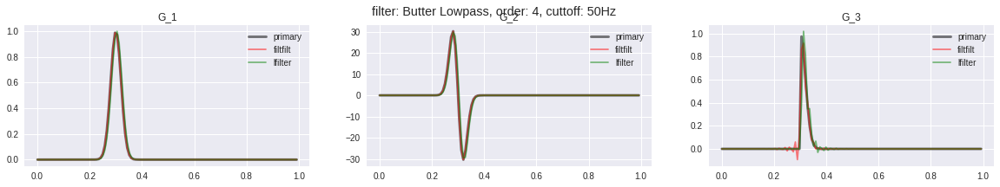

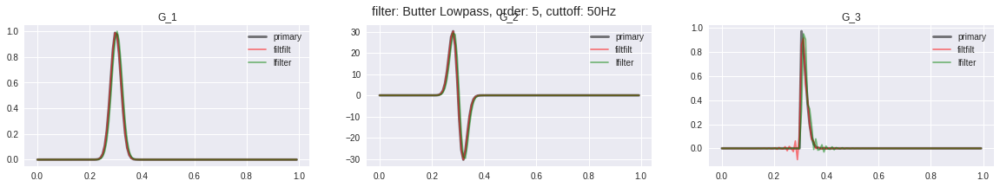

In [141]:
Fs = 128

orders = range(1,6)
cutoffs = [30, 40, 50]

t, s1 = g_1(**params)
t, s2 = g_2(**params)
t, s3 = g_3(**params)

plot_response((s1, s2, s3), t, _butter_lowpass, Fs, cutoffs, orders)

#### High Pass

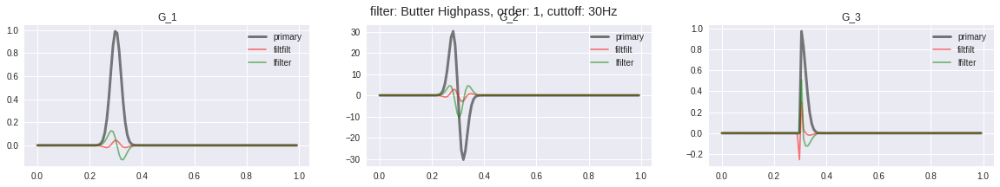

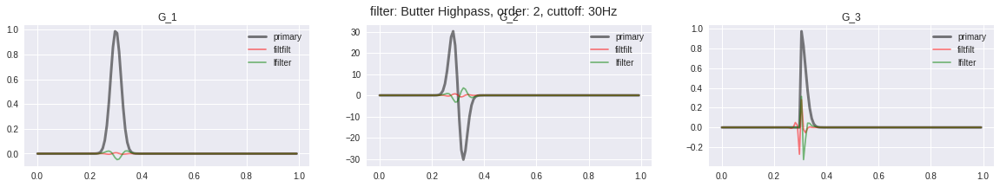

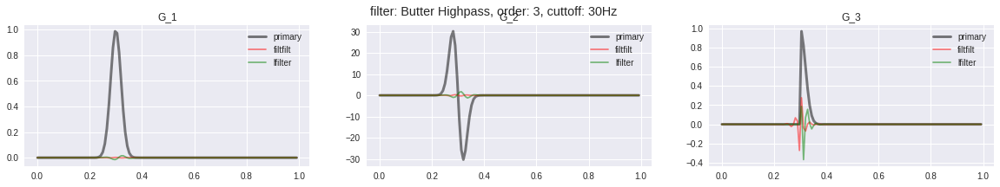

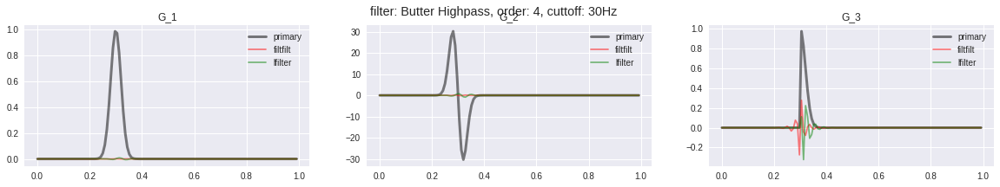

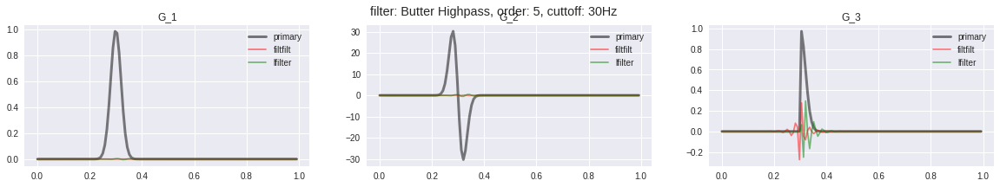

...

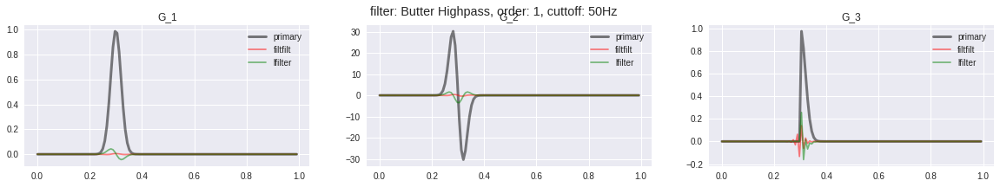

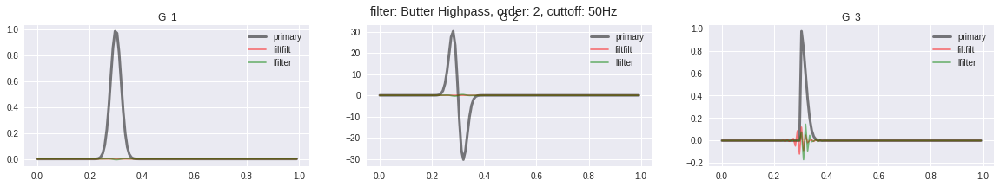

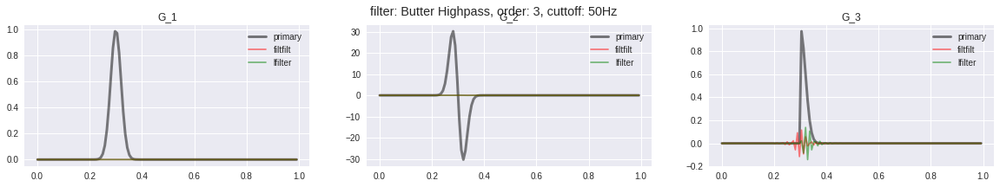

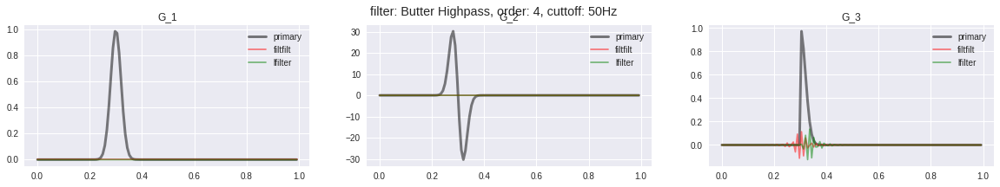

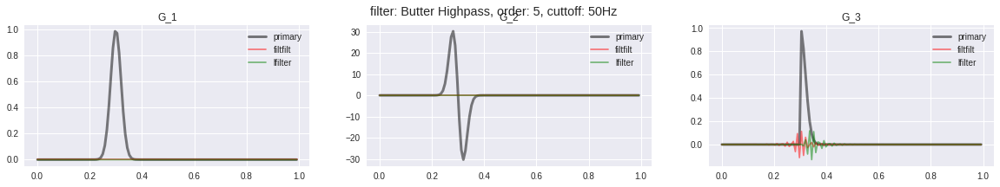

In [142]:
Fs = 128

orders = range(1,6)
cutoffs = [30, 40, 50]

t, s1 = g_1(**params)
t, s2 = g_2(**params)
t, s3 = g_3(**params)

plot_response((s1, s2, s3), t, _butter_highpass, Fs, cutoffs, orders)

#### Notch (Cheby2)

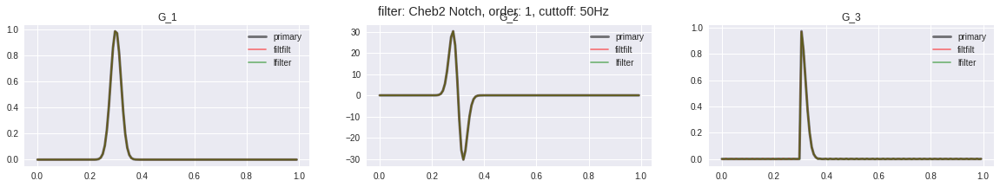

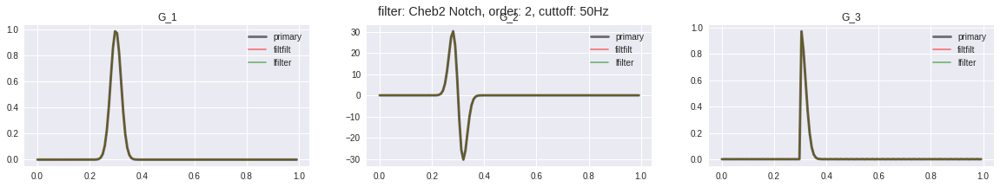

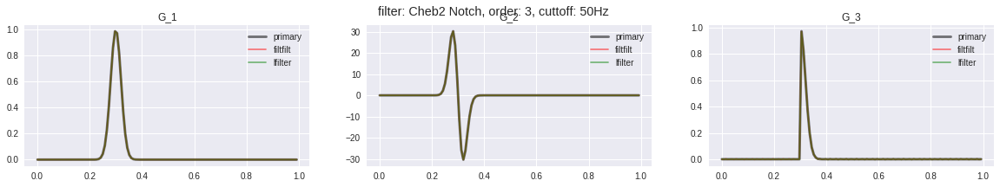

In [174]:
Fs = 128

cutoffs = [50]
orders = range(1,4)

t, s1 = g_1(**params)
t, s2 = g_2(**params)
t, s3 = g_3(**params)

plot_response((s1, s2, s3), t, _cheb2_notch, Fs, cutoffs, orders)

### Sygnał + Szum

In [0]:
def syg_plus_noise(g, N, params):
  x, g = g(**params)
  sims = np.empty((N, len(x)))
  for i in range(N):
    x, g_noise = noise(**params)
    sims[i] = g + g_noise
  return x, sims

In [0]:
def f(t, signals, filter_function, cutoffs, orders, Fs):
  for cutoff, order in itertools.product(cutoffs, orders):

    b, a = filter_function(cutoff, Fs, order)

    fig = plt.figure(figsize=(15, 3))
    fig.subplots_adjust(hspace=.5)
    
    fig.tight_layout()

    for i, signal in enumerate(signals):
      fig.add_subplot(1, len(signals), i+1)

      y = []

      for s in signal:
        y.append(filtfilt(b, a, s))

      y = np.mean(y, axis=0)

      plt.plot(t, np.mean(signal, axis=0), c='k', lw='3', alpha=0.5)
      plt.plot(t, y, c='r', alpha=0.5)
      plt.title('G_{}'.format(i+1))
    filter_name = filter_function.__name__[1:].replace("_", " ").title()
    plt.suptitle(f'filter: {filter_name}, order: {order}, cuttoff: {cutoff}Hz')
  plt.show()   

#### Low Pass

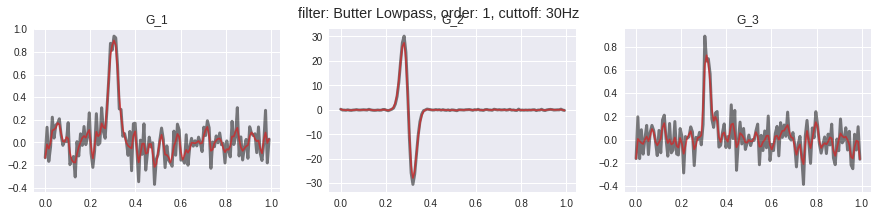

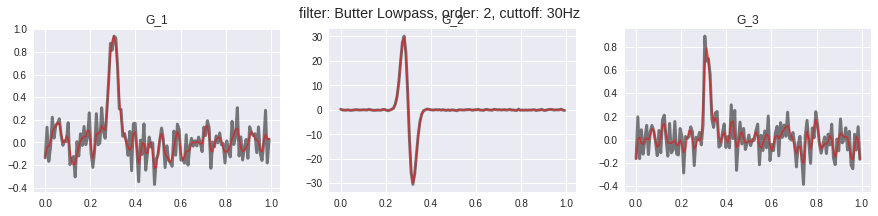

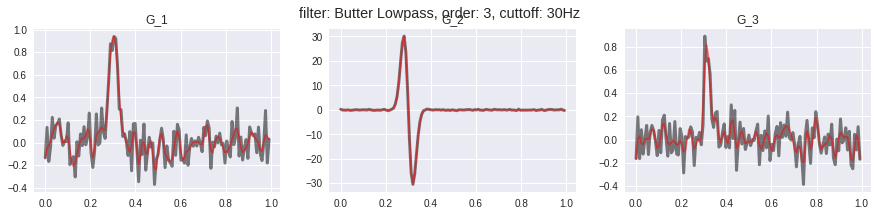

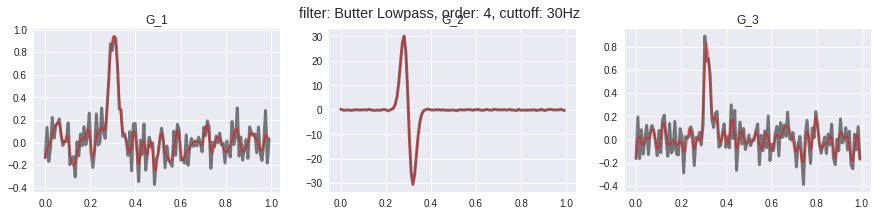

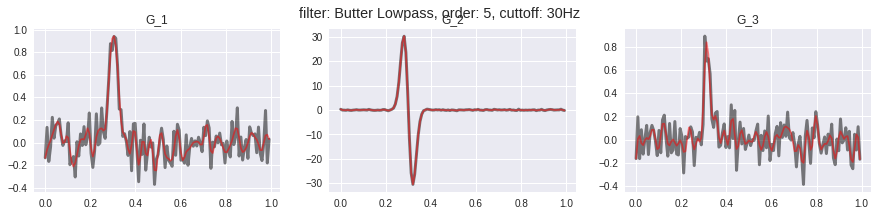

...

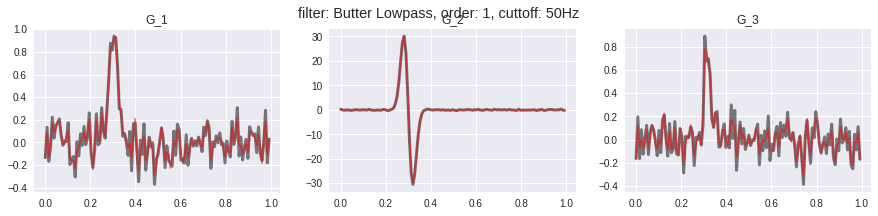

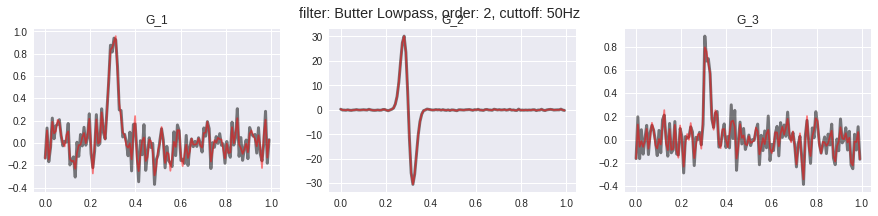

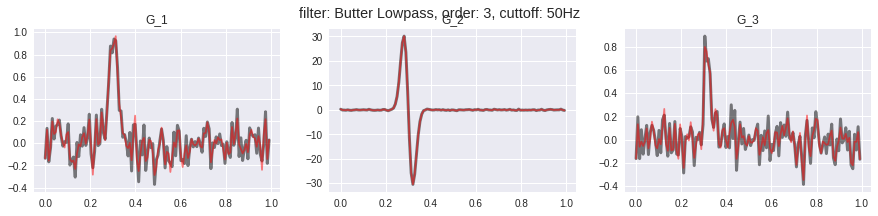

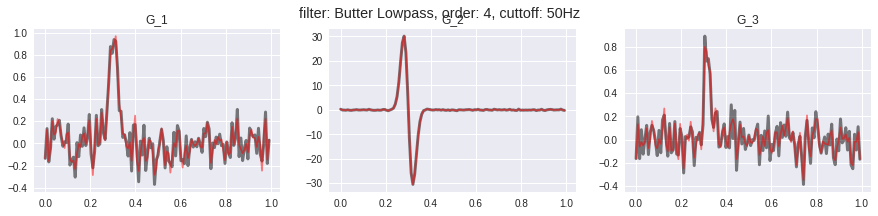

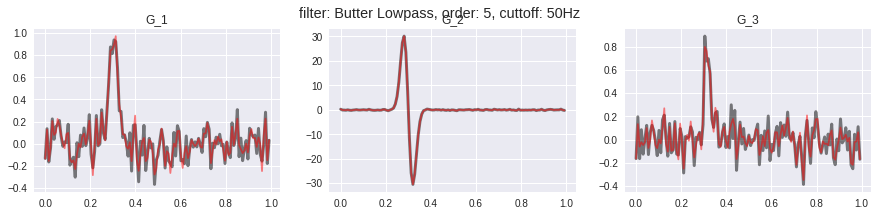

In [182]:
Fs = 128

orders = range(1,6)
cutoffs = [30, 40, 50]

x, signal1 = syg_plus_noise(g_1, 60, params)
x, signal2 = syg_plus_noise(g_2, 60, params)
x, signal3 = syg_plus_noise(g_3, 60, params)

f(x, (signal1, signal2, signal3), _butter_lowpass, cutoffs, orders, Fs)

#### High Pass

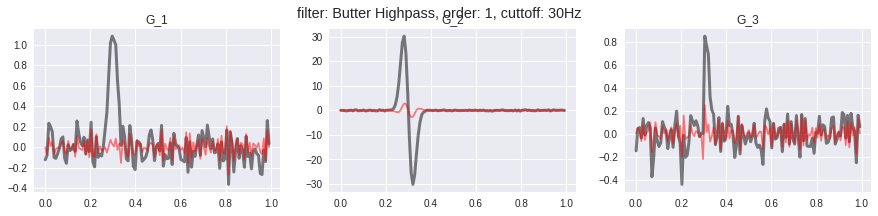

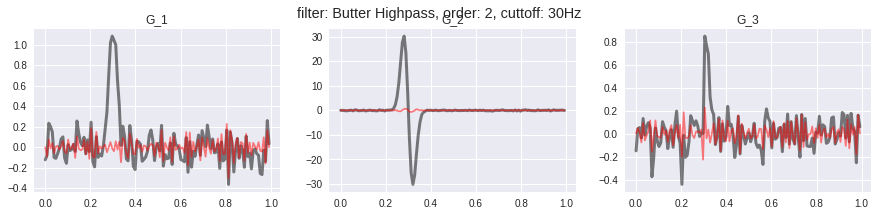

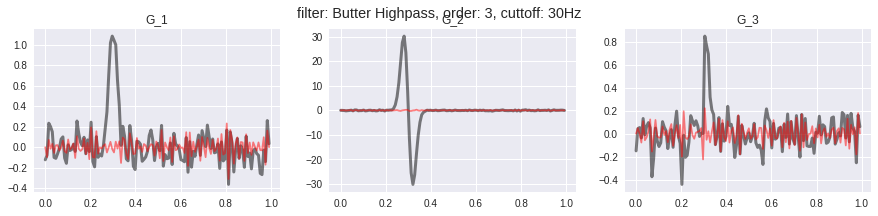

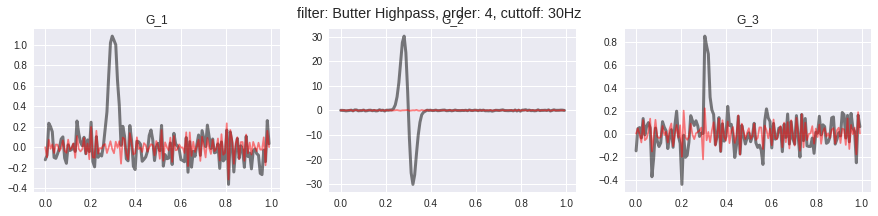

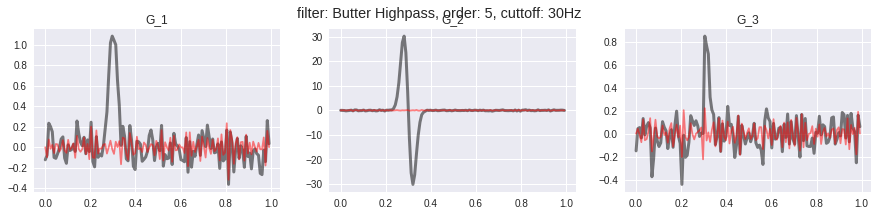

...

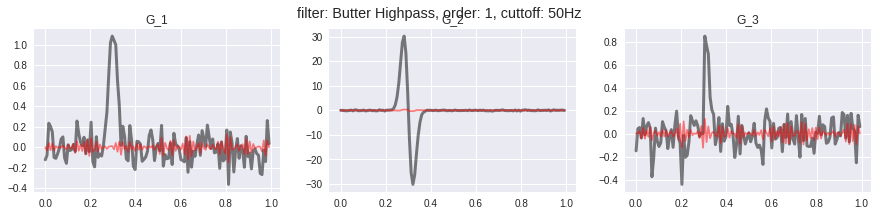

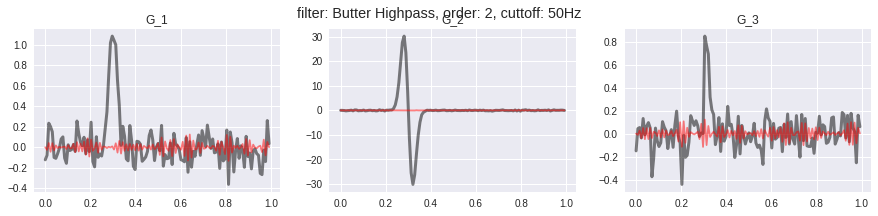

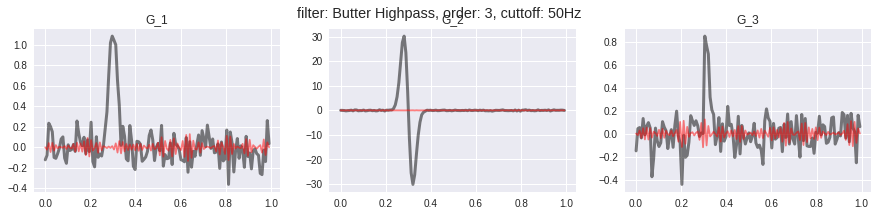

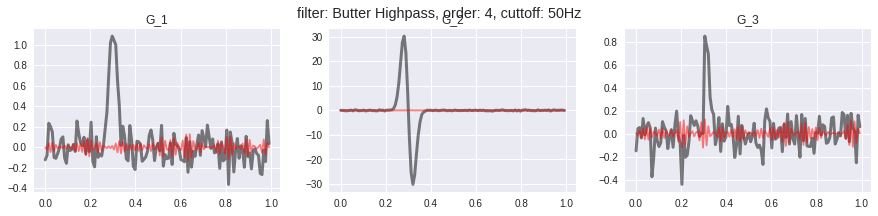

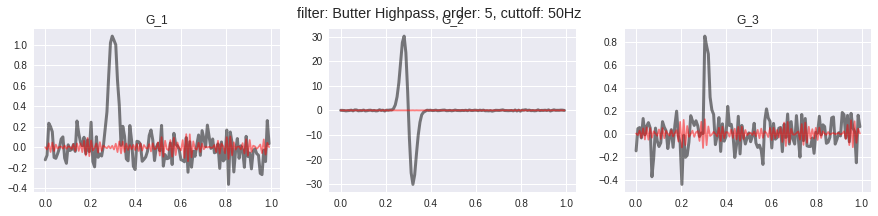

In [179]:
Fs = 128

orders = range(1,6)
cutoffs = [30, 40, 50]

x, signal1 = syg_plus_noise(g_1, 60, params)
x, signal2 = syg_plus_noise(g_2, 60, params)
x, signal3 = syg_plus_noise(g_3, 60, params)

f(x, (signal1, signal2, signal3), _butter_highpass, cutoffs, orders, Fs)

#### Notch (Cheby2)

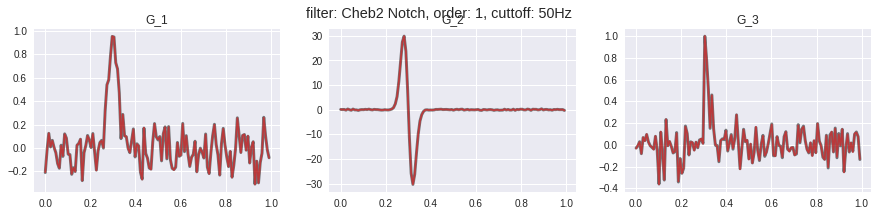

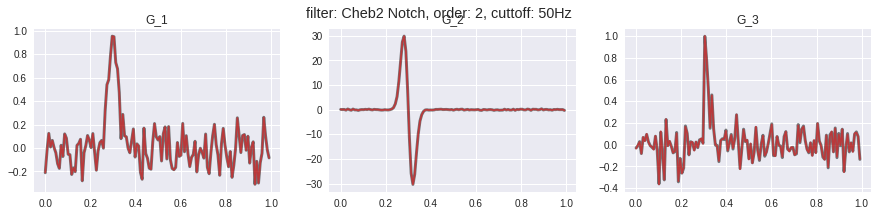

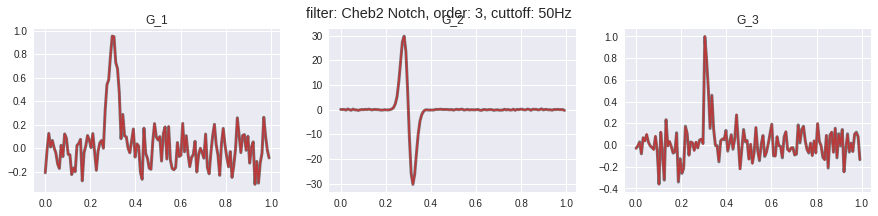

In [180]:
Fs = 128

cutoffs = [50]
orders = range(1,4)

x, signal1 = syg_plus_noise(g_1, 60, params)
x, signal2 = syg_plus_noise(g_2, 60, params)
x, signal3 = syg_plus_noise(g_3, 60, params)

f(x, (signal1, signal2, signal3), _cheb2_notch, cutoffs, orders, Fs)

# Analiza Sygnału

In [33]:
import os

!pip install obci_readmanager
from obci_readmanager.signal_processing.read_manager import ReadManager

##Wersja 1: Obserwacja błyskającej  diody

### ***Jedna dioda***

---






### Read Data

#### Reading signals


In [150]:
filename = "p300_1.1"
site = 'http://studenci.fuw.edu.pl/~cp383253/cw2/'

extentions = ['.xml', '.raw', '.tag']

for ext in extentions:

  if os.path.isfile(filename+ext):
    pass
  else:
    www = os.path.join(site, filename+ext)
    os.system(f'wget {www}')

mgr = ReadManager("%s.xml"%filename, "%s.raw"%filename, "%s.tag"%filename)
fs = int(float(mgr.get_param("sampling_frequency")))
num_of_channels = int(mgr.get_param("number_of_channels"))
channels_names = mgr.get_param("channels_names")

raw_syg = mgr.get_microvolt_samples()
t = np.arange(syg.shape[1])/fs


2018-11-08 14:34:03,635 - data_source - INFO - All data set requested for the first time. Start reading all data from the file...


#### Montage

In [0]:
montage_syg = np.copy(raw_syg)
montage_syg[:-3,:] -= (raw_syg[channels_names.index('TP9'),:] + raw_syg[channels_names.index('TP10'),:])/2

### Filtering

#### Define filter

In [0]:
def filter_data(data, fs):
  '''
  Filtering 0.1 - 20 Hz
  '''
  data = butter_lowpass_filter(data, 20, fs, order=2)

  data = butter_highpass_filter(data, 0.1, fs, order=2)

  data = notch_filter(data, 50, fs)

  return data

In [0]:
syg = np.copy(montage_syg[:, 74*fs :int(175*1.06*fs)])


for channel in channels_names[:-3]:
  index = channels_names.index(channel)
  syg[index,:] = filter_data(syg[index,:], fs)

#### Display Filtered Data

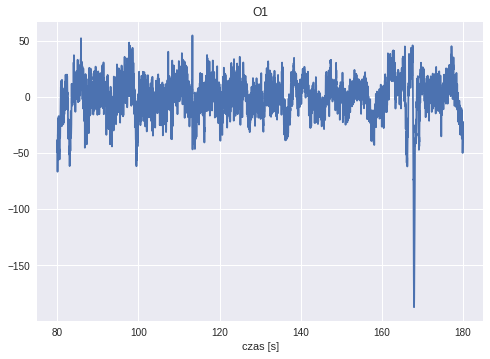

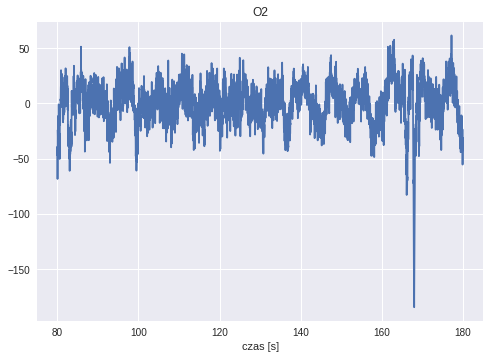

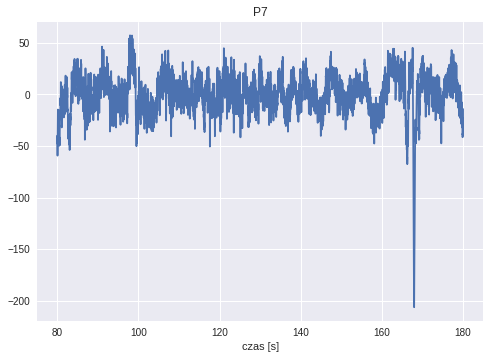

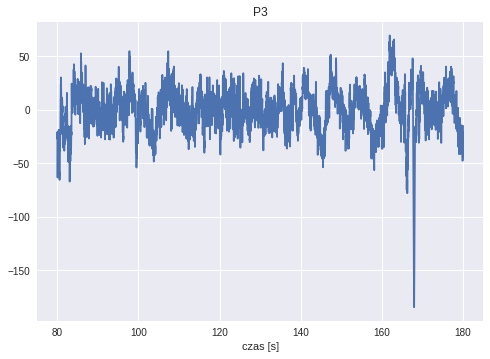

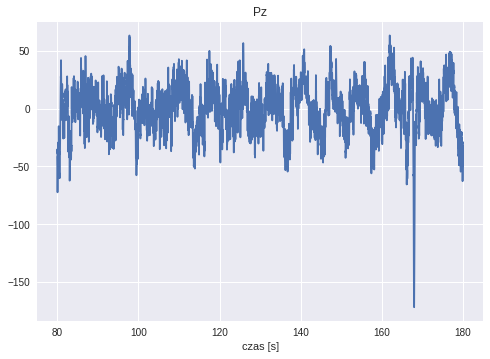

...

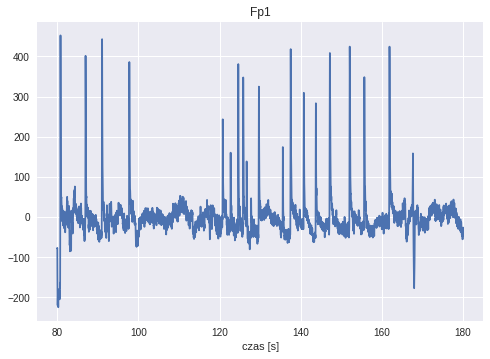

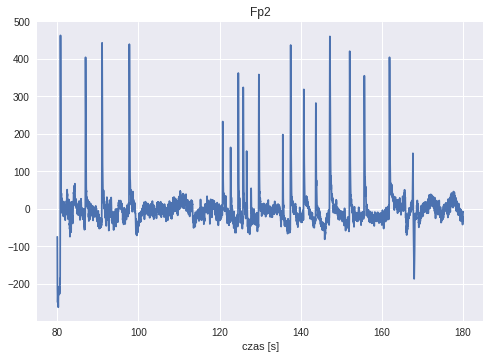

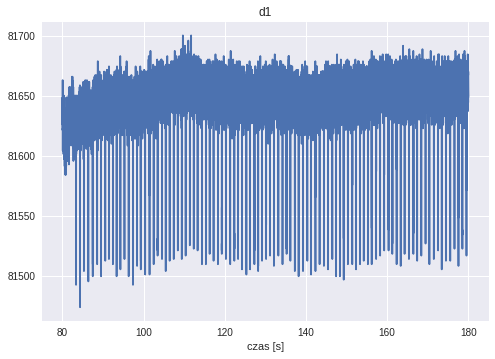

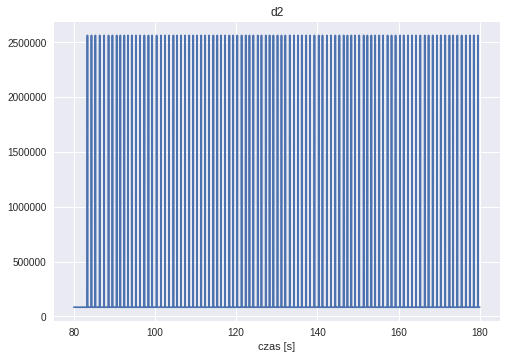

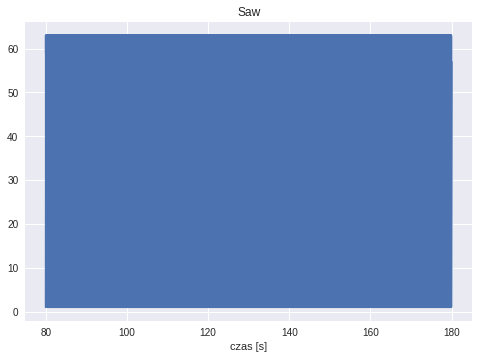

In [38]:
for i, channel in zip(range(len(channels_names)), channels_names):
  
  start_time = 80
  end_time = 180
  
  plt.plot(
      t[start_time * fs:end_time * fs],
      syg[i, start_time * fs:end_time * fs]
  )
  plt.title(channel)
  plt.xlabel('czas [s]')
  plt.show()

### Detect artifacts

In [0]:
def find_artefacts_tags(syg, threshold=70):
  return np.array([index for index, value in enumerate(syg) if value > threshold or value < -threshold])

artefacts = find_artefacts_tags(syg[channels_names.index('Fp1'), :])

### Diode Populate

In [0]:
def diode_to_tags(signal):
  signal /= np.max(signal)
  
  indexes = [i for i, sig in enumerate(signal) if sig > 0.9]
  
  index_indexes = [i for i, index in enumerate(np.diff(indexes)) if index > 1]
  
  index_indexes += [len(indexes) - 1]
  
  tags = list(map(lambda x: indexes[x], index_indexes))
  
  return np.array(tags)

In [0]:
index = channels_names.index('d2')

tags = diode_to_tags(syg[index, :])

#### Time to Tags

In [0]:
def time_to_tags(time, fs):
  '''
  time - time in seconds
  fs - sampling rate
  '''
  return int(time * fs)

#### Population

In [0]:
def is_there_an_artefact_constructor(low, high):
	return lambda x: x >= low and x <= high

def is_artifact_for_tag(low, high):
  def output(tag):
    number_of_artefacts = len(list(filter(
          is_there_an_artefact_constructor(tag + low, tag + high + 1),
          artefacts
      )))
    
    return False if number_of_artefacts else True
  
  return output
  

def populate_tag(tag, syg, low, high):

  return syg[:, tag + low : tag + high + 1]

def populate_tags(tags, syg, low=-0.3, high=0.4, fs=128):
  '''
  syg - array of channels with shape (n, Fs)
  '''
  low_tag_diff = time_to_tags(low, fs)
  
  high_tag_diff = time_to_tags(high, fs)
  
  _tags = list(filter(is_artifact_for_tag(low_tag_diff, high_tag_diff), tags))
  
  populated_tags_generator = map(
      lambda tag: populate_tag(tag, syg, low_tag_diff, high_tag_diff),
      _tags
  )
  
  delta = high - low

  t = np.arange(int(fs * delta))
  t = t / fs - 0.3
  
  return t, np.array(list(populated_tags_generator))
  

#### Full

6.747197535040246


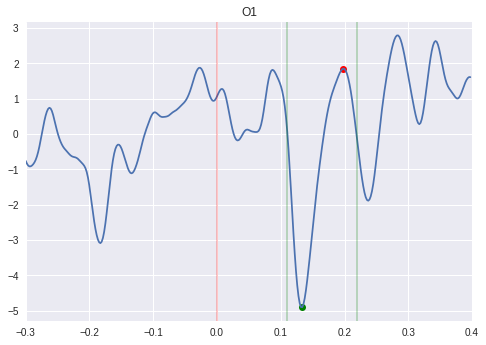

4.140661318964712


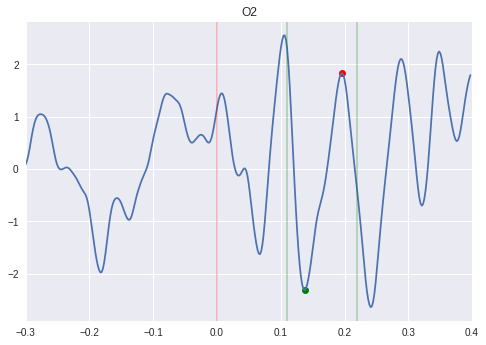

4.433236821575819


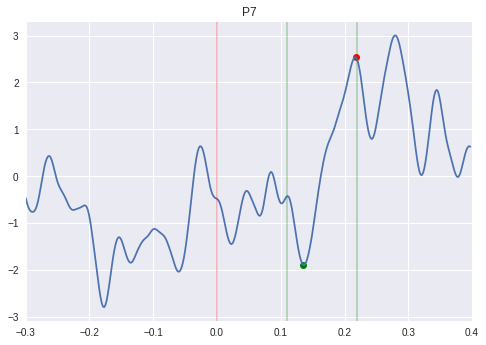

5.335334673167677


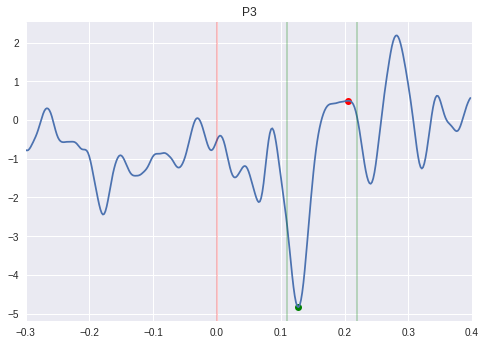

2.5995568030485434


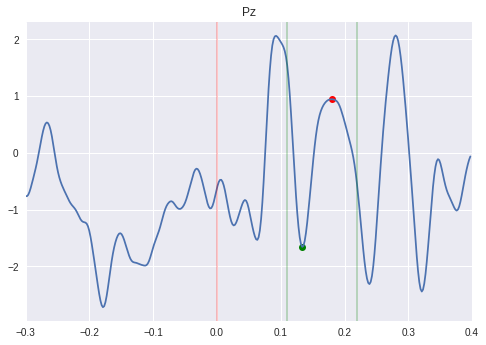

3.23245118277722


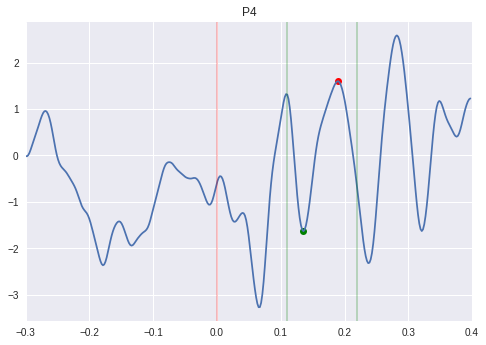

4.184262500697421


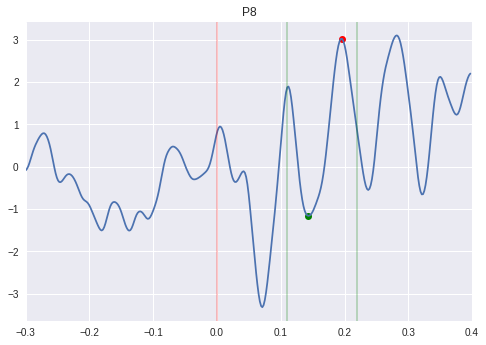

1.300857095952464


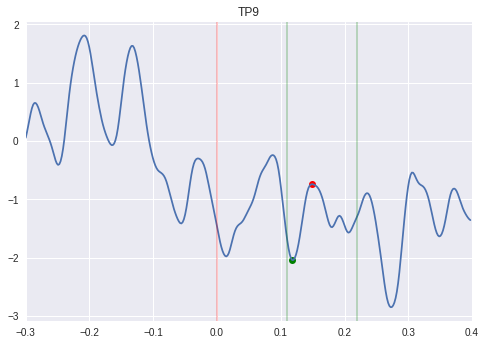

0.8301714723606903


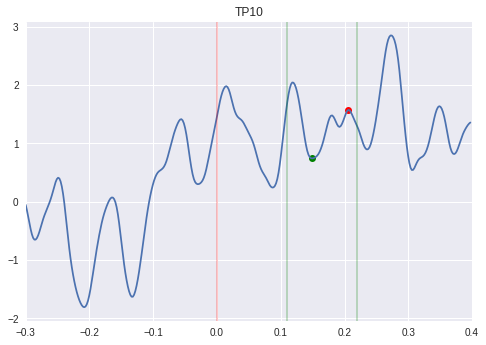

1.2571185867430896


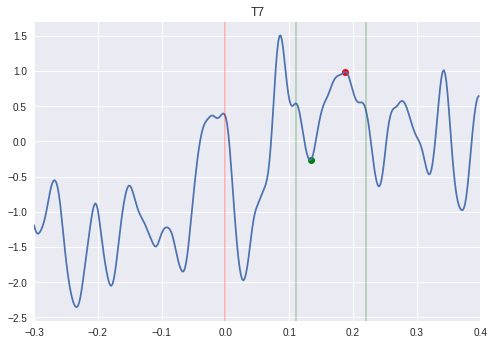

1.6838615978317475


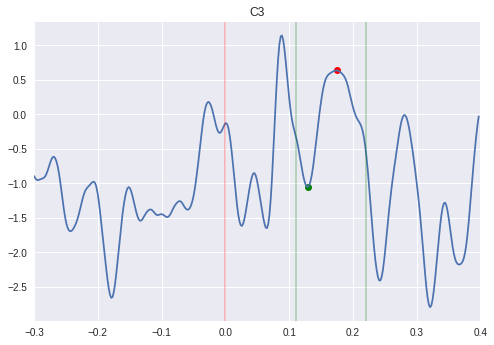

0.0


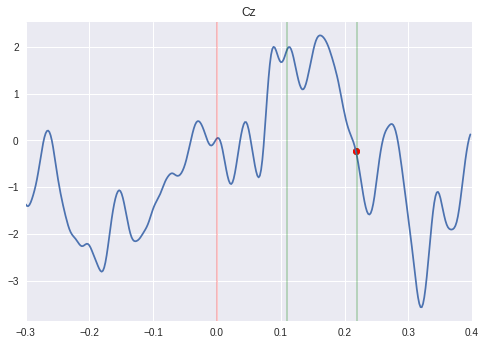

0.0


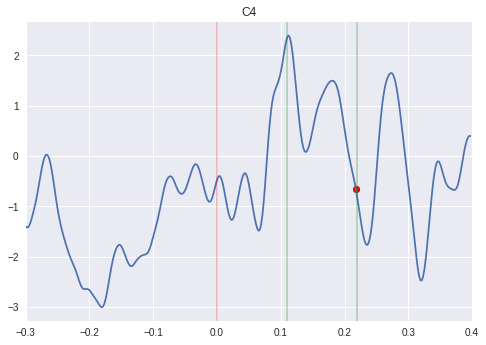

1.6434228805313924


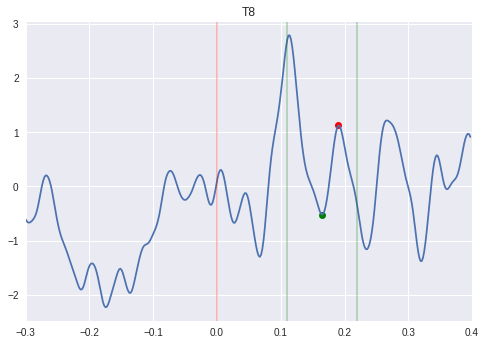

0.0


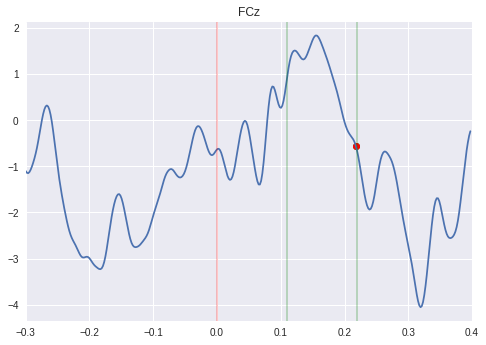

11.429715716059444


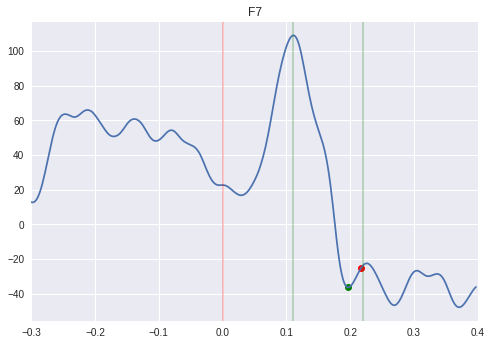

0.17357500797111758


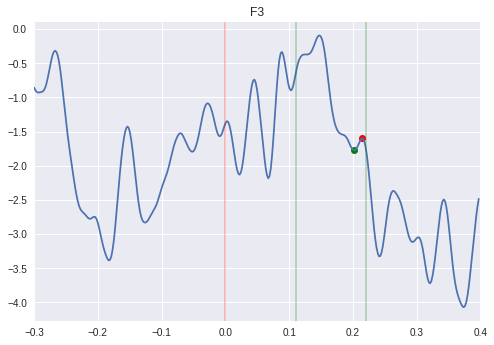

0.0


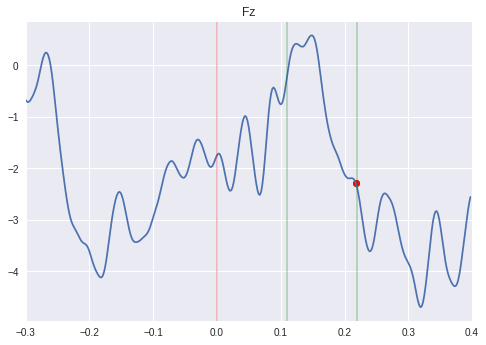

0.0


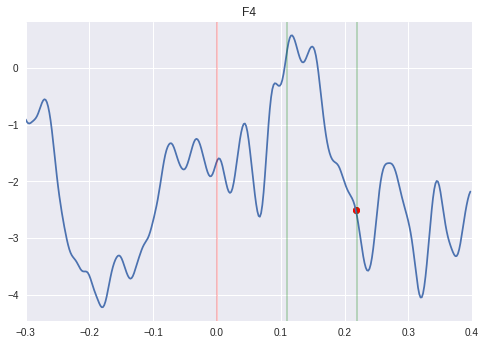

0.0


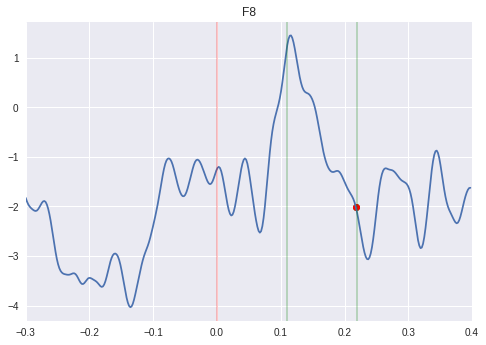

0.0


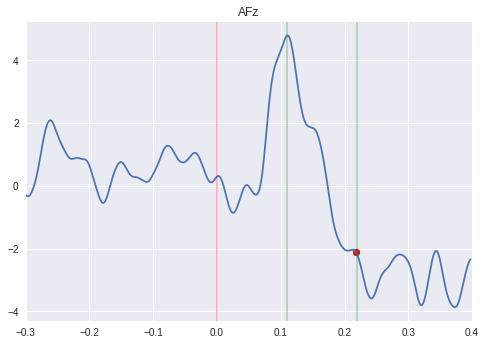

0.14700491869256016


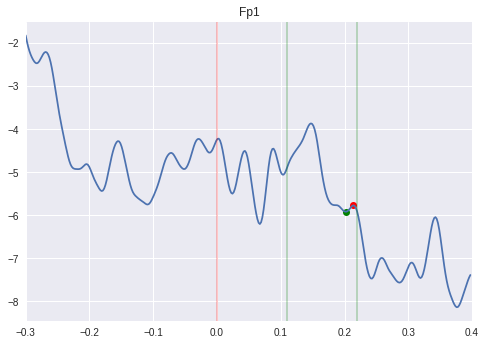

0.0


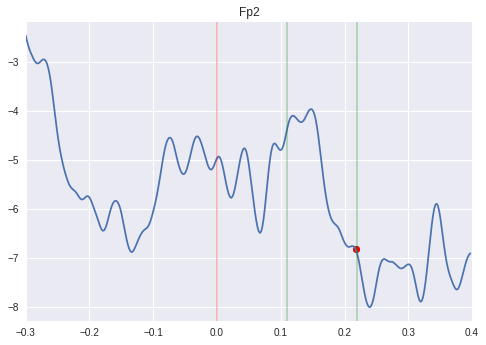

3.5128734177560546


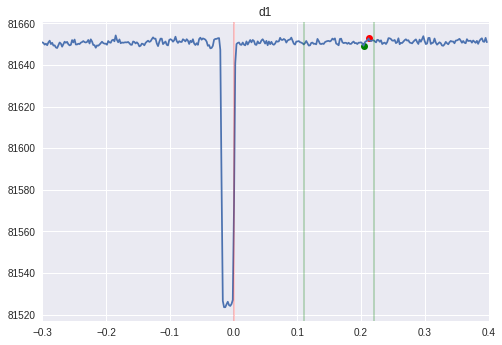

2.4453965738191474e-06


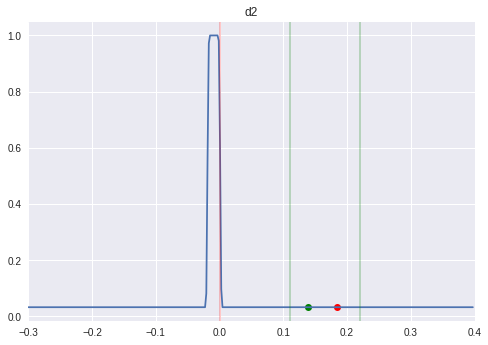

7.367088607594937


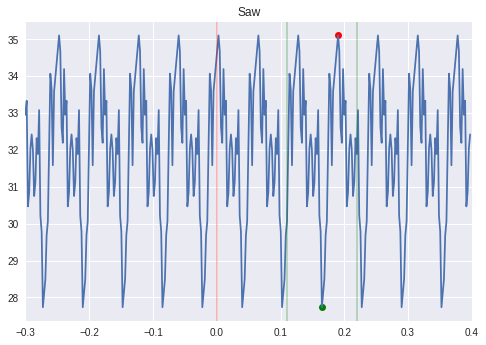

In [182]:
index = channels_names.index('d2')

tags = diode_to_tags(syg[index, :])

t, erp_components = populate_tags(tags, syg, fs=fs)

erps = np.mean(erp_components, axis=0)

for erp, channel_name in zip(erps, channels_names):
  plt.title(channel_name)
 
  
  low = int((0.11 + 0.3) * fs)
  high = int((0.22 + 0.3) * fs)
  
  _min = np.min(erp[low:high])
  
  index_min = np.where(erp[low:high] == _min)[0][0]
  
  plt.plot(t[low + index_min], _min, 'go')
  
  low += index_min
  
  _max = np.max(erp[low:high])
  
  index_max = np.where(erp[low:high] == _max)[0][0]

  plt.plot(t[low + index_max], _max, 'ro')
  
  print(_max - _min)
    
  plt.plot(t, erp)
  plt.axvline(0, color='r', alpha=0.25)
  plt.axvline(0.11, color='g', alpha=0.25)
  plt.axvline(0.22, color='g', alpha=0.25)
  plt.xlim(-0.3, 0.4)
  plt.show()

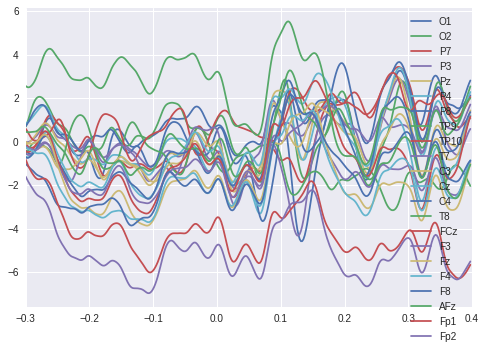

In [174]:
for erp, channel_name in zip(erps[:-3], channels_names[:-3]):
  if channel_name == 'F7':
    continue

  plt.plot(t, erp, label=channel_name)
  plt.xlim(-0.3, 0.4)
plt.legend()
plt.show()

### ICA

Nieważne

Automatically created module for IPython interactive environment
  Running setup.py bdist_wheel for sklearn ... - done
  Stored in directory: /root/.cache/pip/wheels/76/03/bb/589d421d27431bcd2c6da284d5f2286c8e3b2ea3cf1594c074
Successfully built sklearn


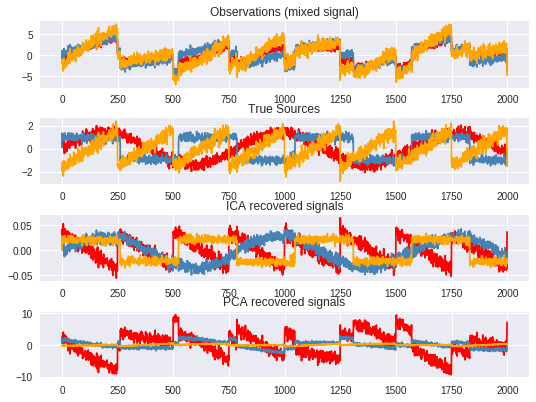

In [21]:
print(__doc__)

import numpy as np
import matplotlib.pyplot as plt
from scipy import signal


!pip install sklearn
from sklearn.decomposition import FastICA, PCA

###############################################################################
# Generate sample data
np.random.seed(0)
n_samples = 2000
time = np.linspace(0, 8, n_samples)

s1 = np.sin(2 * time)  # Signal 1 : sinusoidal signal
s2 = np.sign(np.sin(3 * time))  # Signal 2 : square signal
s3 = signal.sawtooth(2 * np.pi * time)  # Signal 3: saw tooth signal

S = np.c_[s1, s2, s3]
S += 0.2 * np.random.normal(size=S.shape)  # Add noise

S /= S.std(axis=0)  # Standardize data
# Mix data
A = np.array([[1, 1, 1], [0.5, 2, 1.0], [1.5, 1.0, 2.0]])  # Mixing matrix
X = np.dot(S, A.T)  # Generate observations

# Compute ICA
ica = FastICA(n_components=3)
S_ = ica.fit_transform(X)  # Reconstruct signals
A_ = ica.mixing_  # Get estimated mixing matrix

# We can `prove` that the ICA model applies by reverting the unmixing.
assert np.allclose(X, np.dot(S_, A_.T) + ica.mean_)

# For comparison, compute PCA
pca = PCA(n_components=3)
H = pca.fit_transform(X)  # Reconstruct signals based on orthogonal components

###############################################################################
# Plot results

plt.figure()

models = [X, S, S_, H]
names = ['Observations (mixed signal)',
         'True Sources',
         'ICA recovered signals', 
         'PCA recovered signals']
colors = ['red', 'steelblue', 'orange']

for ii, (model, name) in enumerate(zip(models, names), 1):
    plt.subplot(4, 1, ii)
    plt.title(name)
    for sig, color in zip(model.T, colors):
        plt.plot(sig, color=color)

plt.subplots_adjust(0.09, 0.04, 0.94, 0.94, 0.26, 0.46)
plt.show()



In [24]:
plt.plot(mgr.get_microvolt_samples(['d1']))

TypeError: ignored

In [25]:
dir(mgr)

['__class__',
 '__deepcopy__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_rm_from_mne_data',
 '_set_meas_date',
 '_set_mne_tags',
 'data_source',
 'from_mne',
 'get_all_samples',
 'get_channel_samples',
 'get_channels_samples',
 'get_microvolt_samples',
 'get_mne_info',
 'get_mne_raw',
 'get_param',
 'get_params',
 'get_samples',
 'get_tags',
 'info_source',
 'init_mne',
 'iter_samples',
 'iter_tags',
 'mne_annotations',
 'mne_events',
 'reset_params',
 'save_to_file',
 'set_param',
 'set_params',
 'set_samples',
 'set_tags',
 'tags_source']

In [26]:
channels_names

['O1',
 'O2',
 'P7',
 'P3',
 'Pz',
 'P4',
 'P8',
 'TP9',
 'TP10',
 'T7',
 'C3',
 'Cz',
 'C4',
 'T8',
 'FCz',
 'F7',
 'F3',
 'Fz',
 'F4',
 'F8',
 'AFz',
 'Fp1',
 'Fp2',
 'd1',
 'd2',
 'Saw']

(26, 100384)

In [39]:
for i, n in enumerate(channels_names[:-3]):
  print(f'{n}\t{np.mean(syg[i, 75*fs: 100*fs])}\t{np.std(syg[i, 75*fs: 100*fs])}\t{np.min(syg[i, 75*fs: 100*fs])}\t{np.max(syg[i, 75*fs: 100*fs])}')

O1	2.9270953420828256	24.118706777357126	-66.72747525354201	101.61038709195314
O2	2.3536294222339067	23.963759365252603	-68.27868262702188	109.97143630281926
P7	3.862537877138607	25.97036147977545	-68.07196602146709	101.89783784913479
P3	2.7882372235250283	23.937591900089974	-67.17016228922499	86.51492536093669
Pz	2.6239072147539053	24.32102453783112	-72.43870232650667	95.20368061311311
P4	3.00234032612126	25.387496511077565	-79.5062510312332	98.6200471232714
P8	3.7395733829548385	27.692977631228285	-76.05294146187613	105.57243464062913
TP9	-2.7674324626856195	22.068642533768184	-91.64394635058909	51.95548311911735
TP10	2.7674324632095773	22.068642532653115	-51.955483116786	91.64394635084157
T7	1.8227805155497907	26.70987129621866	-72.74989780054167	134.2838346692835
C3	2.9660347631322446	27.633194454771075	-79.5704629070146	115.8413444713962
Cz	2.837624263106948	28.42637514450389	-93.69909168639984	93.3432150476533
C4	3.346654481487385	28.06296806119762	-90.36698786239977	96.421769573

In [0]:
\t

In [0]:
d2 = syg[channels_names.index('d2'),:]


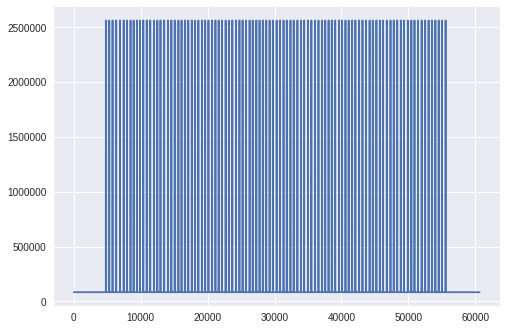

In [72]:
plt.plot(d2)
plt.show()

In [68]:
syg.shape

(26, 100384)

In [67]:
type(syg)

numpy.ndarray

### coś

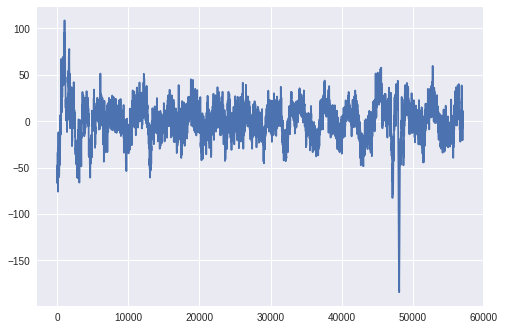

In [86]:
plt.plot(syg[1,:])
plt.show()

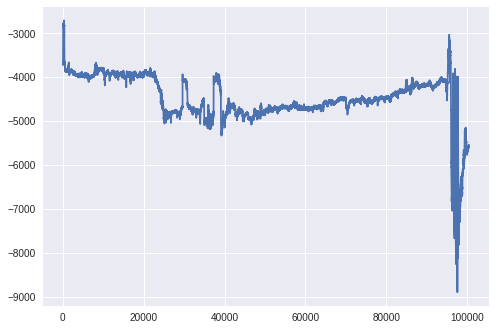

In [0]:
d2_mask = np.less(d2, np.mean(d2))

indexes = [i for i in range(1, len(d2_mask)) if d2_mask[i-1]==1 and d2_mask[i]==0]
minus_delta, plus_delta = int(0.3*fs), int(.4*fs)
indexes_boundaries = [(i-minus_delta, i + plus_delta) for i in indexes]


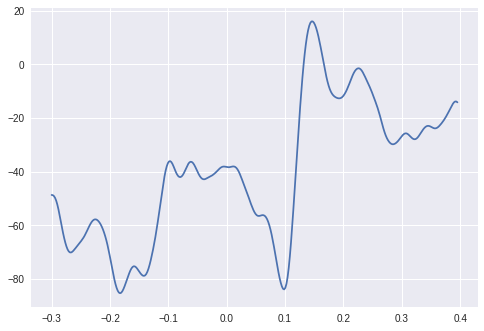

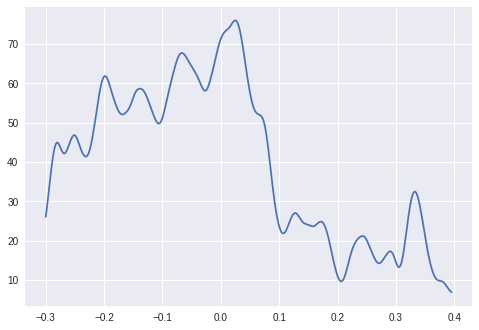

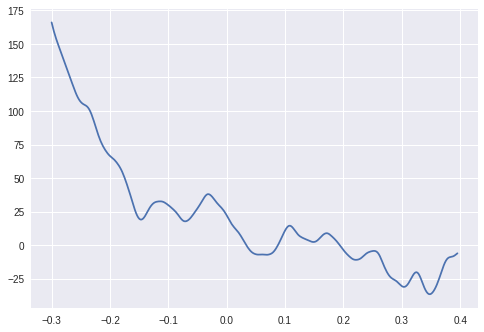

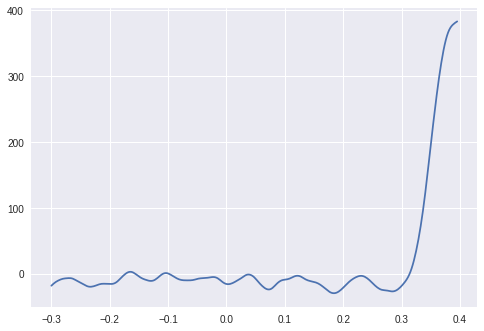

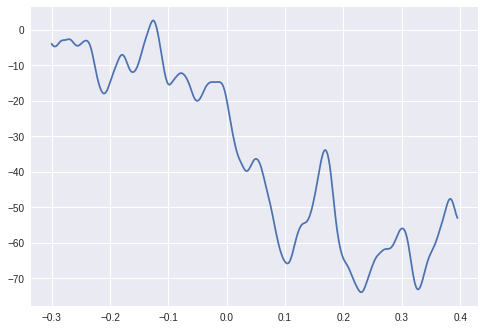

...

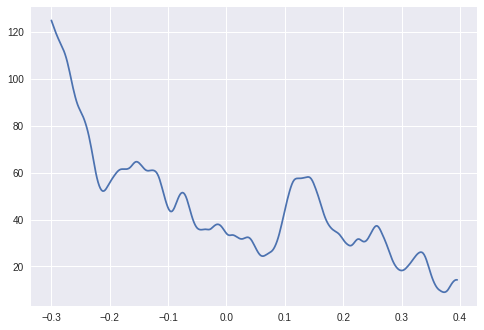

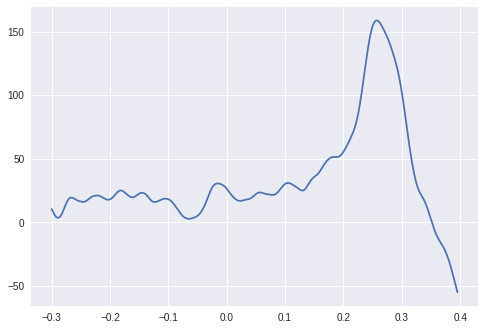

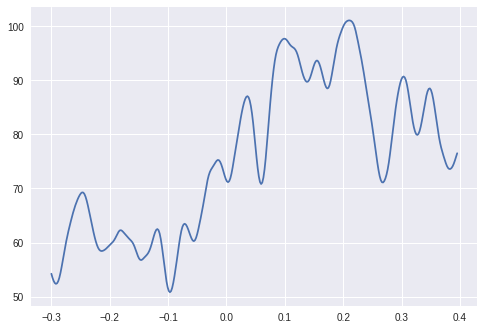

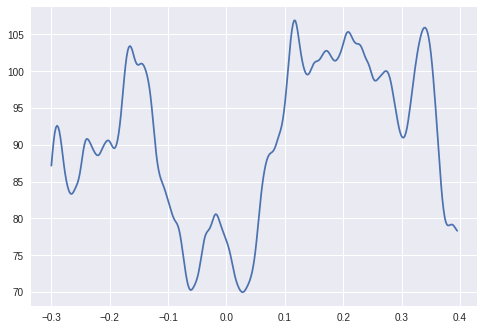

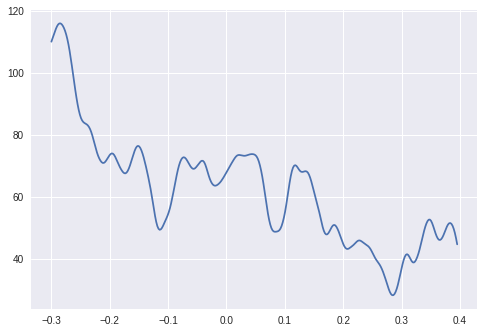

left = 79
4621	4978
5131	5488
8774	9131
11808	12165
12791	13148
24593	24950
25556	25913
26579	26936
27122	27479
31185	31542
32222	32579
33800	34157
35350	35707
37426	37783
39942	40299
41442	41799
45070	45427
47660	48017
54379	54736
54881	55238
55413	55770


In [197]:
indexes_filterd = []
removed = []
for i, index in  enumerate(indexes):
  bound_low, bound_high = indexes_boundaries[i]
  s = syg[channels_names.index('Fp1'),bound_low:bound_high]
  s_min, s_max = np.min(s), np.max(s)
  boundaries = (bound_low, bound_high)
  if s_min < -70 or s_max > 70:
    if boundaries not in removed:
      removed.append(boundaries)
      plt.plot(np.arange(int(fs*0.7)-1)/fs -0.3, s)
      plt.show()
  else:
    if boundaries not in indexes_filterd:
      indexes_filterd.append(boundaries)
    
print('left =', len(indexes_filterd))
for x in removed:
  print('%s\t%s'%x)

In [184]:
print(len(indexes_filterd))

79


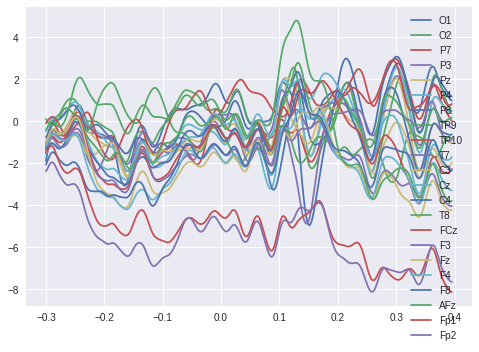

In [195]:
for k, name in enumerate(channels_names[:-3]):
  if name == 'F7':
    continue
  p300 = np.zeros(int(fs*0.7)-1)

  for bound_low, bound_high in indexes_filterd:
    p300 += syg[k,bound_low:bound_high]


  p300 /= len(indexes_filterd)
  plt.plot(np.arange(int(fs*0.7)-1)/fs -0.3, p300, label=name)

plt.legend()
plt.show()

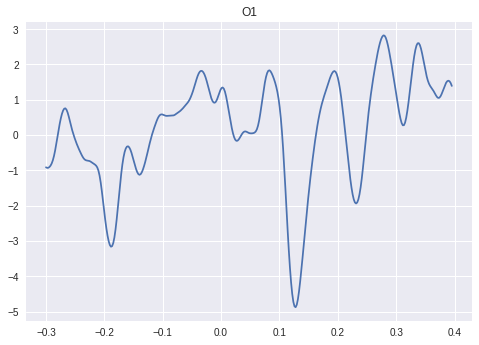

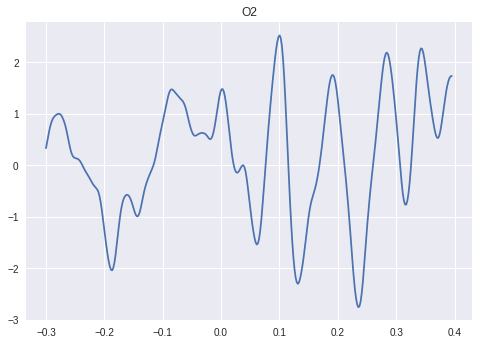

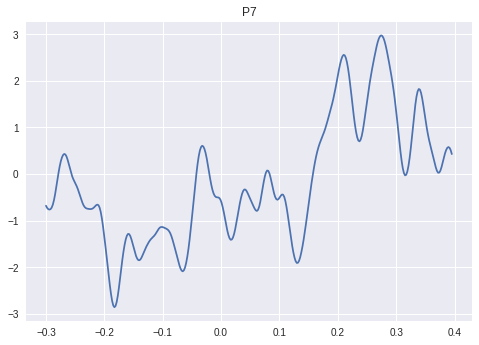

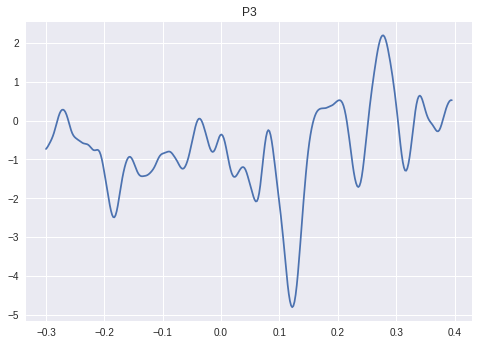

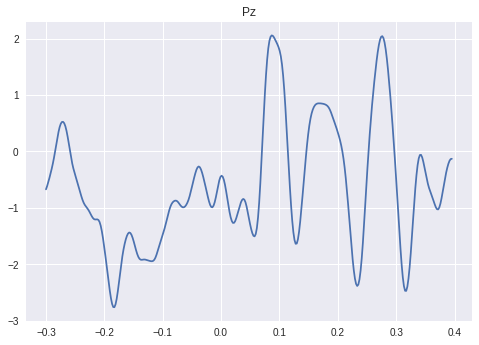

...

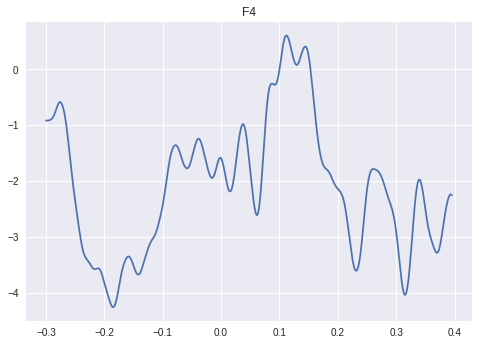

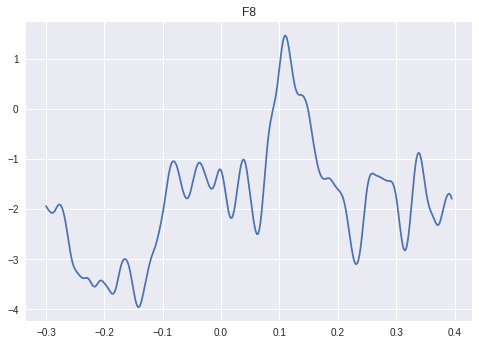

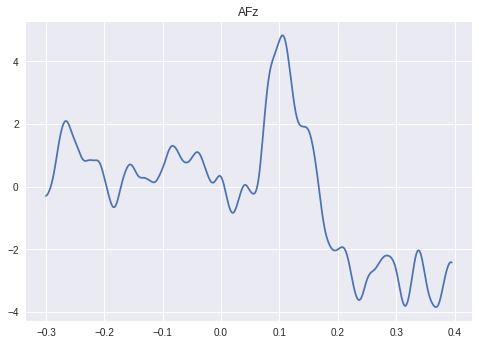

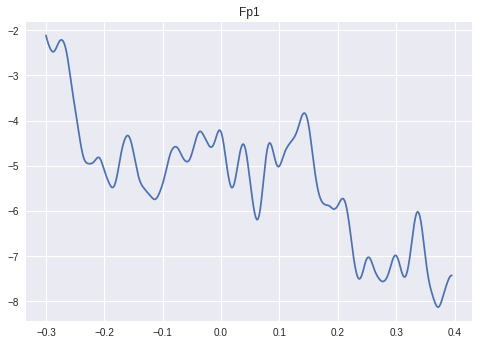

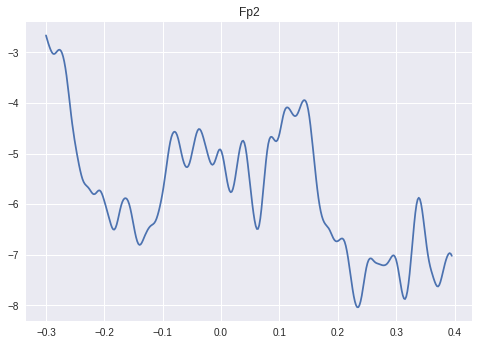

In [186]:
for k, name in enumerate(channels_names[:-3]):
  if name == 'F7':
    continue
  p300 = np.zeros(int(fs*0.7)-1)

  for bound_low, bound_high in indexes_filterd:
    p300 += syg[k,bound_low:bound_high]


  p300 /= len(indexes_filterd)
  plt.plot(np.arange(int(fs*0.7)-1)/fs -0.3, p300)

  plt.title(name)
  plt.show()

In [128]:
indexes

[12486, 20677, 28770, 37118, 45236, 53531]

In [136]:
indexes_filterd

[4633,
 4990,
 5143,
 5500,
 5636,
 5993,
 6186,
 6543,
 6746,
 7103,
 7301,
 7658,
 7790,
 8147,
 8323,
 8680,
 8786,
 9143,
 9289,
 9646,
 9755,
 10112,
 10232,
 10589,
 10743,
 11100]

In [150]:
indexes_filterd

[(4633, 4990),
 (5143, 5500),
 (5636, 5993),
 (6186, 6543),
 (6746, 7103),
 (7301, 7658),
 (7790, 8147),
 (8323, 8680),
 (8786, 9143),
 (9289, 9646),
 (9755, 10112),
 (10232, 10589),
 (10743, 11100),
 (11272, 11629),
 (11820, 12177),
 (12333, 12690),
 (12803, 13160),
 (13360, 13717),
 (13912, 14269),
 (14426, 14783),
 (14928, 15285),
 (15484, 15841),
 (15949, 16306),
 (16446, 16803),
 (16959, 17316),
 (17475, 17832),
 (17979, 18336),
 (18467, 18824),
 (18991, 19348),
 (19487, 19844),
 (19972, 20329),
 (20524, 20881),
 (21018, 21375),
 (21497, 21854),
 (21984, 22341),
 (22541, 22898),
 (23024, 23381),
 (23541, 23898),
 (24084, 24441),
 (24606, 24963),
 (25077, 25434),
 (25568, 25925),
 (26123, 26480),
 (26591, 26948),
 (27134, 27491),
 (27615, 27972),
 (28097, 28454),
 (28617, 28974),
 (29115, 29472),
 (29603, 29960),
 (30161, 30518),
 (30686, 31043),
 (31197, 31554),
 (31679, 32036),
 (32234, 32591),
 (32716, 33073),
 (33274, 33631),
 (33812, 34169),
 (34289, 34646),
 (34844, 35201),
 

### ***Dwie diody***

---






### Read Data

#### Reading signals


In [220]:
filename = "p300_1.2"
site = 'http://studenci.fuw.edu.pl/~cp383253/cw2/'

extentions = ['.xml', '.raw', '.tag']

for ext in extentions:

  if os.path.isfile(filename+ext):
    pass
  else:
    www = os.path.join(site, filename+ext)
    os.system(f'wget {www}')

mgr = ReadManager("%s.xml"%filename, "%s.raw"%filename, "%s.tag"%filename)
fs = int(float(mgr.get_param("sampling_frequency")))
num_of_channels = int(mgr.get_param("number_of_channels"))
channels_names = mgr.get_param("channels_names")

raw_syg = mgr.get_microvolt_samples()
t = np.arange(syg.shape[1])/fs


2018-11-08 15:21:13,019 - data_source - INFO - All data set requested for the first time. Start reading all data from the file...


#### Montage

In [0]:
montage_syg = np.copy(raw_syg)
montage_syg[:-3,:] -= (raw_syg[channels_names.index('TP9'),:] + raw_syg[channels_names.index('TP10'),:])/2

### Filtering

#### Define filter

In [0]:
def filter_data(data, fs):
  '''
  Filtering 0.1 - 20 Hz
  '''
  data = butter_lowpass_filter(data, 20, fs, order=2)

  data = butter_highpass_filter(data, 0.1, fs, order=2)

  data = notch_filter(data, 50, fs)

  return data

In [0]:
syg = np.copy(montage_syg)


for channel in channels_names[:-3]:
  index = channels_names.index(channel)
  syg[index,:] = filter_data(syg[index,:], fs)

#### Display Filtered Data

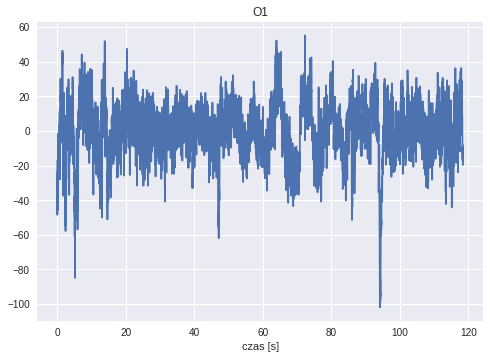

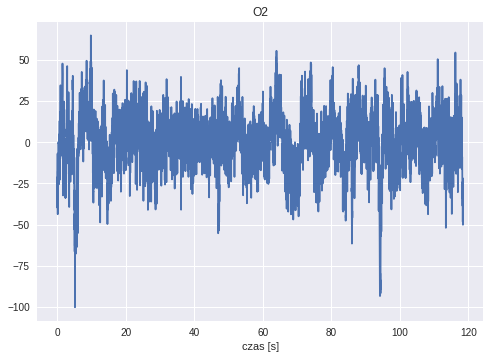

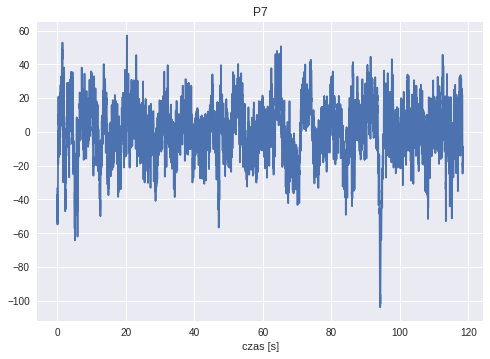

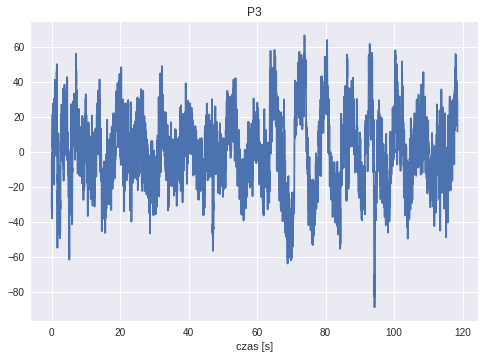

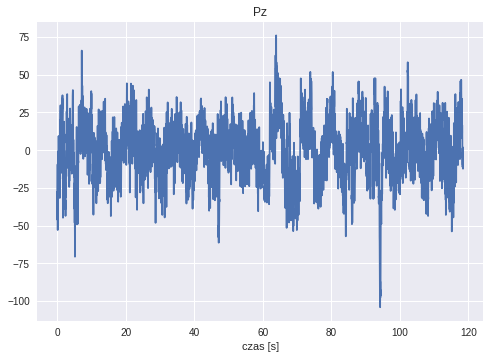

...

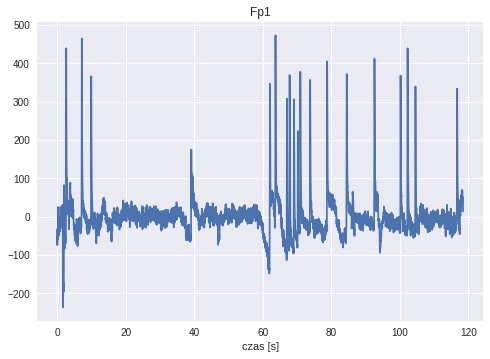

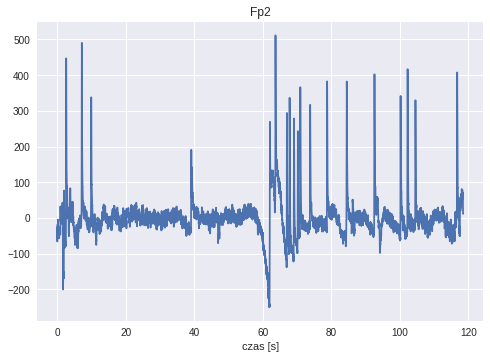

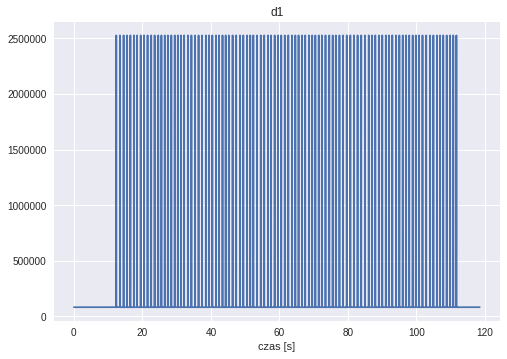

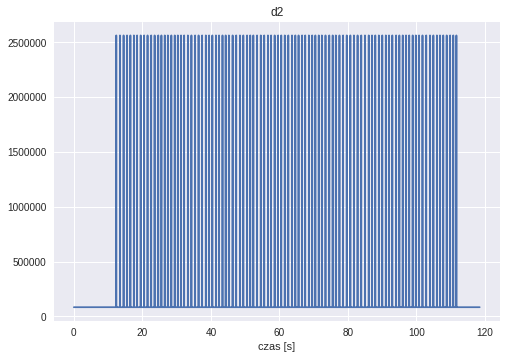

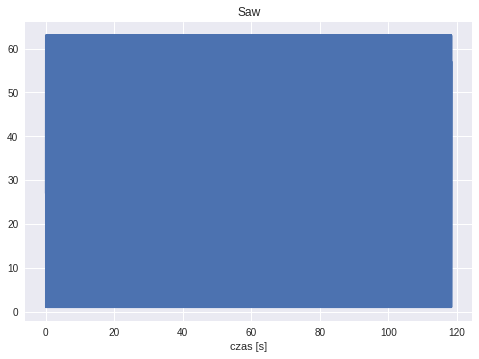

In [227]:
for i, channel in zip(range(len(channels_names)), channels_names):
  
  start_time = 0
  end_time = 1800
  
  plt.plot(
      t[start_time * fs:end_time * fs],
      syg[i, start_time * fs:end_time * fs]
  )
  plt.title(channel)
  plt.xlabel('czas [s]')
  plt.show()

In [0]:
d2_mask = np.less(d2, np.mean(d2))

indexes = [i for i in range(1, len(d2_mask)) if d2_mask[i-1]==1 and d2_mask[i]==0]
minus_delta, plus_delta = int(0.3*fs), int(.4*fs)
indexes_boundaries = [(i-minus_delta, i + plus_delta) for i in indexes]


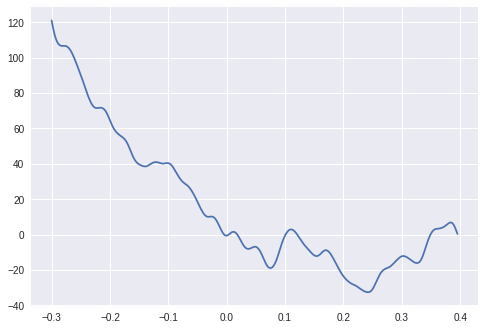

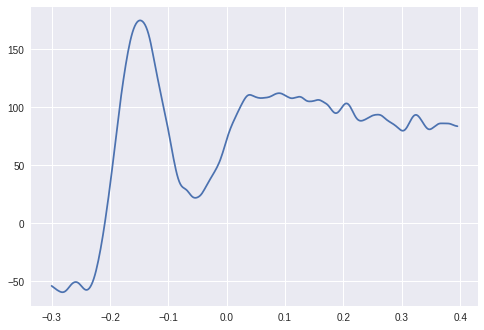

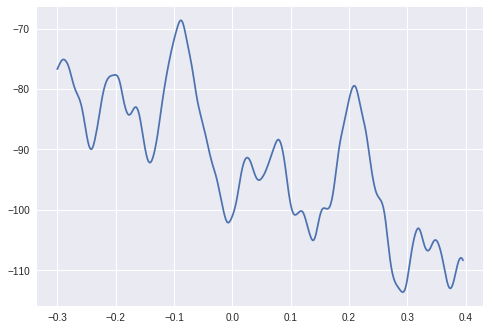

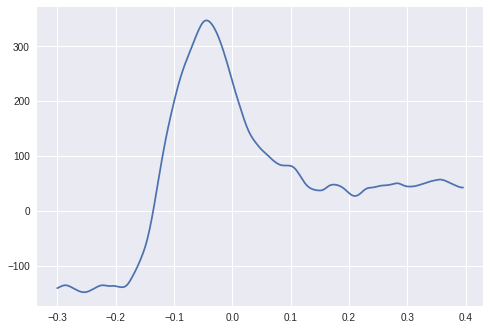

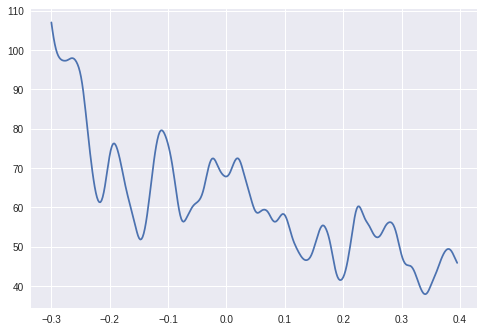

...

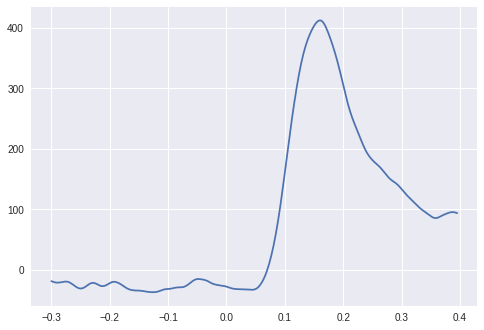

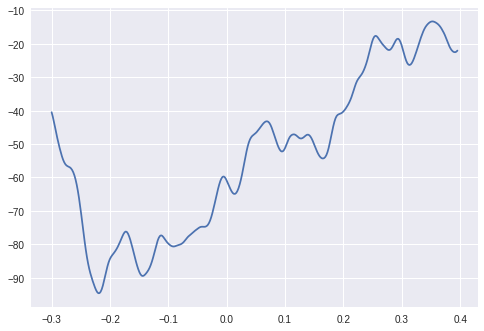

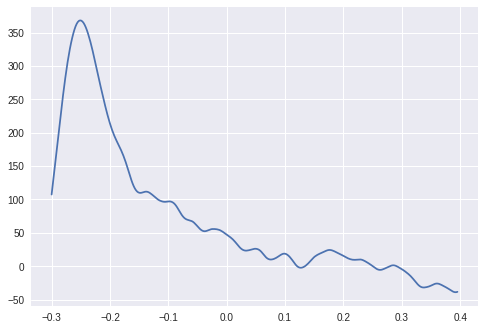

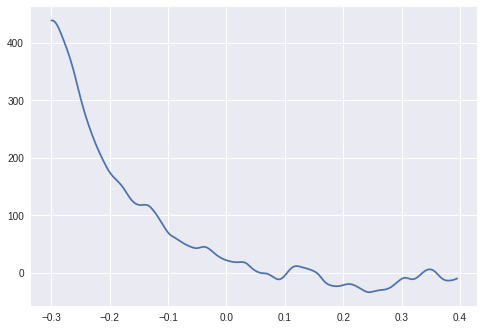

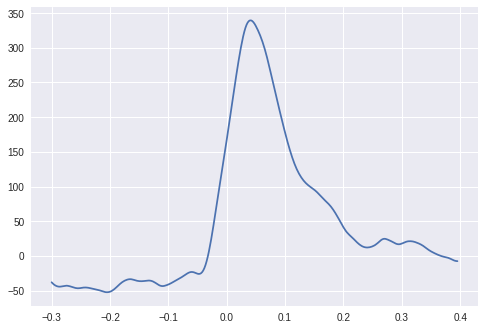

left = 80
5131	5488
19959	20316
31185	31542
31666	32023
32704	33061
33800	34157
34277	34634
34831	35188
35350	35707
35894	36251
36409	36766
37426	37783
40446	40803
42489	42846
42988	43345
47179	47536
48185	48542
51294	51651
52366	52723
53365	53722


In [229]:
indexes_filterd = []
removed = []
for i, index in  enumerate(indexes):
  bound_low, bound_high = indexes_boundaries[i]
  s = syg[channels_names.index('Fp1'),bound_low:bound_high]
  s_min, s_max = np.min(s), np.max(s)
  boundaries = (bound_low, bound_high)
  if s_min < -70 or s_max > 70:
    if boundaries not in removed:
      removed.append(boundaries)
      plt.plot(np.arange(int(fs*0.7)-1)/fs -0.3, s)
      plt.show()
  else:
    if boundaries not in indexes_filterd:
      indexes_filterd.append(boundaries)
    
print('left =', len(indexes_filterd))
for x in removed:
  print('%s\t%s'%x)

In [230]:
print(len(indexes_filterd))

80


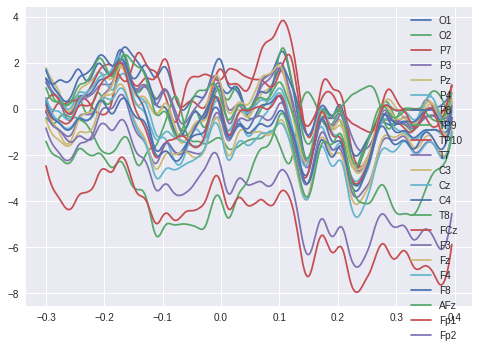

In [232]:
for k, name in enumerate(channels_names[:-3]):
  if name == 'F7':
    continue
  p300 = np.zeros(int(fs*0.7)-1)

  for bound_low, bound_high in indexes_filterd:
    p300 += syg[k,bound_low:bound_high]


  p300 /= len(indexes_filterd)
  plt.plot(np.arange(int(fs*0.7)-1)/fs -0.3, p300, label=name)

plt.legend()
plt.show()

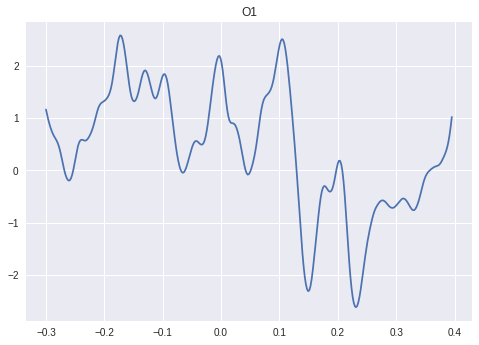

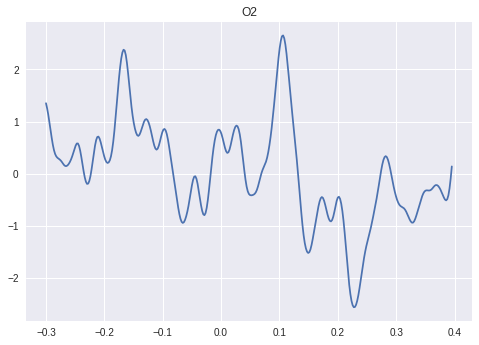

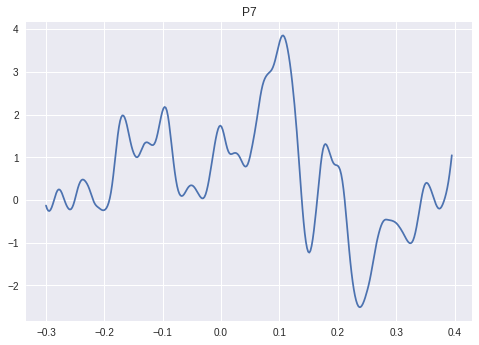

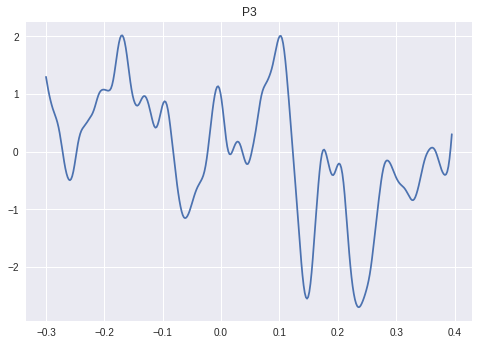

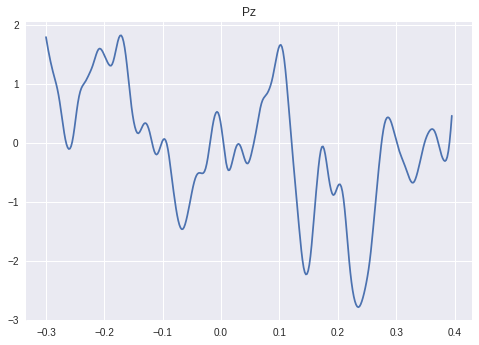

...

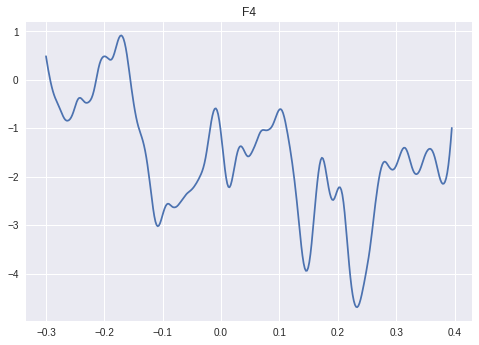

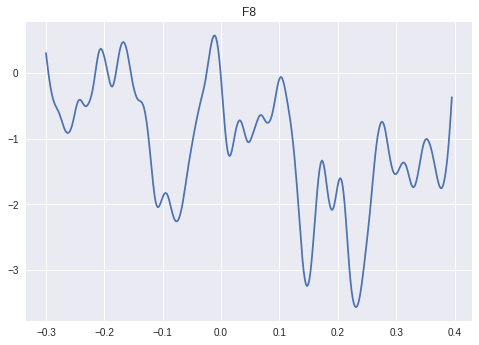

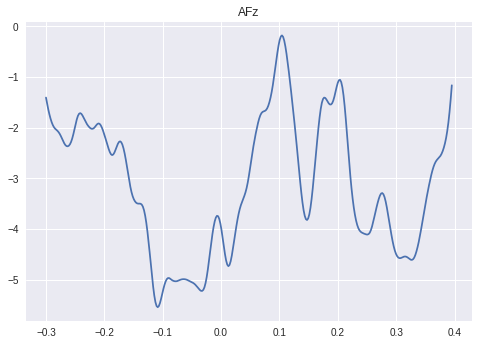

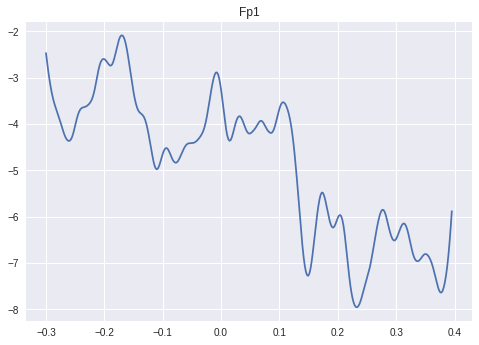

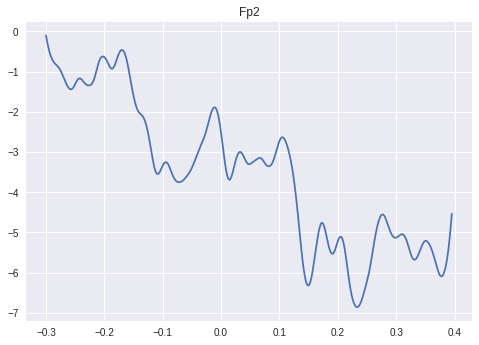

In [231]:
for k, name in enumerate(channels_names[:-3]):
  if name == 'F7':
    continue
  p300 = np.zeros(int(fs*0.7)-1)

  for bound_low, bound_high in indexes_filterd:
    p300 += syg[k,bound_low:bound_high]


  p300 /= len(indexes_filterd)
  plt.plot(np.arange(int(fs*0.7)-1)/fs -0.3, p300)

  plt.title(name)
  plt.show()

In [0]:
indexes

In [0]:
indexes_filterd

In [0]:
indexes_filterd